<a href="https://colab.research.google.com/github/antoalli/AlliDataScience/blob/master/thesis_v2(presented).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#@title
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Show Code"></form>''')

In [0]:
#git integration
!git clone https://github.com/antoalli/AlliDataScience.git
!ls

Cloning into 'AlliDataScience'...
remote: Enumerating objects: 35, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 35 (delta 12), reused 30 (delta 9), pack-reused 0
Unpacking objects: 100% (35/35), done.
AlliDataScience  sample_data


# Data Spaces Thesis


---


Antonio Alliegro, mat: s250104, mail: antonio.alliegro@studenti.polito.it<br>
<br>
Data Spaces Course 18-19, Ingegneria Informatica<br>
prof. Francesco Vaccarino<br>
Politecnico di Torino


---



I decided to work on **UCI Heart Disease** dataset.<br>
Source Information:
   - Title: Heart Disease Databases
   - Creators: 
       1. Hungarian Institute of Cardiology. Budapest: Andras Janosi, M.D.
       2. University Hospital, Zurich, Switzerland: William Steinbrunn, M.D.
       3. University Hospital, Basel, Switzerland: Matthias Pfisterer, M.D.
       4. V.A. Medical Center, Long Beach and Cleveland Clinic Foundation: Robert Detrano, M.D., Ph.D.
   - Donor: David W. Aha (aha@ics.uci.edu) (714) 856-8779   
   - Date: July, 1988

This dataset is composed by 4 parts:
1. Cleveland Clinic Foundation
2. Hungarian Institute of Cardiology, Budapest
3. V.A. Medical Center, Long Beach, CA
4. University Hospital, Zurich, Switzerland

My analysis will focus on the first dataset part (**Cleveland Clinic Foundation**) simply because it is the one less affected by missing values or other types of mess.<br>

The used **environment** is Python 3.6.8 with the following libraries:
1. Pandas, *Python Data Analysis Library*, open-source
2. Numpy, *fundamental package for scientific computing with Python,* open-source
3. Scikit-learn, *Simple and efficient tools for data mining and data analysis*,  open-source
4. Plotly, *graphing library makes interactive, publication-quality graphs online*, open-source core
5. Seaborn, *Python data visualization library based on matplotlib*, BSD License

### Utility Functions

In [0]:
import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
# seaborn paper context
sns.set_context("paper", font_scale=1.4)
sns.set(style="whitegrid")

In [0]:
# utiliy code for Plotly offline plotting
import plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import Contours, Histogram2dContour, Marker, Scatter, Data, Layout, Figure
import plotly.tools as tools

init_notebook_mode()

# Function def: needed for using Plotly in Google Colab
# Call it in each offline plotting cell
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [0]:
def GridSearch_table_plot(grid_clf, param_name, num_results=15,
                          negative=True, display_table=False,
                          graph=True, display_all_params=True):

    from matplotlib      import pyplot as plt
    from IPython.display import display
    import pandas as pd

    clf = grid_clf.best_estimator_
    clf_params = grid_clf.best_params_
    if negative:
        clf_score = -grid_clf.best_score_
    else:
        clf_score = grid_clf.best_score_
    clf_stdev = grid_clf.cv_results_['std_test_score'][grid_clf.best_index_]
    cv_results = grid_clf.cv_results_

    print("best parameters: {}".format(clf_params))
    print("best score:      {:0.5f} (+/-{:0.5f})".format(clf_score, clf_stdev))
    if display_all_params:
        import pprint
        pprint.pprint(clf.get_params())

    # pick out the best results
    # =========================
    scores_df = pd.DataFrame(cv_results).sort_values(by='rank_test_score')

    best_row = scores_df.iloc[0, :]
    if negative:
        best_mean = -best_row['mean_test_score']
    else:
        best_mean = best_row['mean_test_score']
    best_stdev = best_row['std_test_score']
    best_param = best_row['param_' + param_name]

    # display the top 'num_results' results
    # =====================================
    if display_table:
        display(pd.DataFrame(cv_results) \
            .sort_values(by='rank_test_score').head(num_results))

    # plot the results
    # ================
    scores_df = scores_df.sort_values(by='param_' + param_name)

    if negative:
        means = -scores_df['mean_test_score']
    else:
        means = scores_df['mean_test_score']
    stds = scores_df['std_test_score']
    params = scores_df['param_' + param_name]

    # plot
    if graph:
        plt.figure(figsize=(8, 8))
        plt.errorbar(params, means, yerr=stds)

        plt.axhline(y=best_mean + best_stdev, color='red')
        plt.axhline(y=best_mean - best_stdev, color='red')
        plt.plot(best_param, best_mean, 'or')

        plt.title(param_name + " vs Score\nBest Score {:0.5f}".format(clf_score), fontsize=16)
        plt.xlabel(param_name, fontsize=16)
        plt.xlim(0, 190) # shouldn't be fixed
        plt.ylabel('Score', fontsize=16)
        plt.show()
        

### Importing the Dataset

In [0]:
# dal dataset cleveland originale ho eliminato a mano 7 righe contenenti NULL or Not Defined values
features = ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','target']
df = pd.read_csv("AlliDataScience/datasets/processed_cleveland.data", names=features)
#df = pd.read_csv("datasets/processed_cleveland.data", names=features)
# print(df.info())
print(df.describe())  # description of statistic features

              age         sex          cp    trestbps        chol         fbs  \
count  297.000000  297.000000  297.000000  297.000000  297.000000  297.000000   
mean    54.542088    0.676768    3.158249  131.693603  247.350168    0.144781   
std      9.049736    0.468500    0.964859   17.762806   51.997583    0.352474   
min     29.000000    0.000000    1.000000   94.000000  126.000000    0.000000   
25%     48.000000    0.000000    3.000000  120.000000  211.000000    0.000000   
50%     56.000000    1.000000    3.000000  130.000000  243.000000    0.000000   
75%     61.000000    1.000000    4.000000  140.000000  276.000000    0.000000   
max     77.000000    1.000000    4.000000  200.000000  564.000000    1.000000   

          restecg     thalach       exang     oldpeak       slope          ca  \
count  297.000000  297.000000  297.000000  297.000000  297.000000  297.000000   
mean     0.996633  149.599327    0.326599    1.055556    1.602694    0.676768   
std      0.994914   22.9415

The 'target' field refers to the presence of heart disease in the patient. It is integer valued from 0 (no presence) to 4.
Since we just want to classificate Heart Diseases Affected and Not Affected patients, we just map:<br>
- Values {1, 2, 3, 4} ==> {1} - **Heart Disease Affected Patient**<br>
- Value {0} ==> {0} - **Not Affected Patient**.

In [0]:
# Target column mapping to {0, 1}
target_dict = {0 : 0, 1 : 1, 2 : 1, 3 : 1, 4 : 1}
new_target_col = df.target.map(target_dict)
df.drop(labels='target', axis="columns", inplace=True)
df['target'] = new_target_col

## 1. Data Visualization

Once imported the dataset, let's check data distribution. The objective is to gain some insight on features importance in predicting a patient affected or will be by heart diseases.<br>
Which are the most important features to predict a future heart disease affected patient?

### Boxplot (Method)
#### An efficient visual tool for displaying data distribution
The box plot is a  method for graphically displaying the distribution of data based on the five number summary: **minimum, first quartile, median, third quartile, and maximum**.<br>
See picture, the central rectangle spans the first quartile to the third quartile (the interquartile range or IQR).<br>A segment inside the rectangle shows the median while "whiskers" above and below the box show the locations of the minimum and maximum.<br>
<img src="https://i.ibb.co/PF6GYFZ/boxplot-1.png" alt="boxplot-1" border="0" width="300">
<br>
Not uncommonly real datasets will display surprisingly high maximums or surprisingly low minimums called outliers.<br>John Tukey definition for **outliers**:<br>
Outliers are either 3×IQR or more above the third quartile or 3×IQR or more below the first quartile.<br>
*Suspected outliers* are are slightly more central versions of outliers: either 1.5×IQR or more above the third quartile or 1.5×IQR or more below the first quartile.<br>
If either type of outlier is present the whisker on the appropriate side is taken to 1.5×IQR from the quartile (the "inner fence") rather than the max or min, and individual outlying data points are displayed as unfilled circles (for suspected outliers) or filled circles (for outliers). (The "outer fence" is 3×IQR from the quartile.)<br>
<img src="https://i.ibb.co/v1sskQD/boxplot-2.png" alt="boxplot-2" border="0" width="320">

### Target Count Plot
This feature distinguish between an healthy man and one affected by heart diseases. In the original dataset (from UCI) this was a cathegorical attribute assuming value from 0 to 4. Where 0 meant no heart diseases at all and numbers from 1 to 4 meant presence of heart diseases.<br>

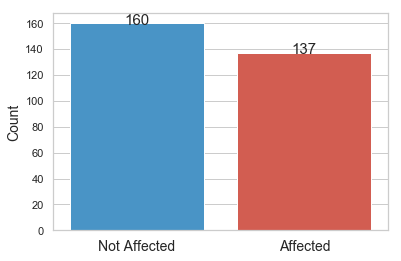

In [0]:
flatui_simple = ["#3498db", "#e74c3c"]
ax=sns.countplot(x='target',data=df, palette=sns.color_palette(flatui_simple));
ax.set_xticklabels(labels=['Not Affected','Affected'], fontsize=14)
ax.set_xlabel('')
ax.set_ylabel("Count",fontsize=14)

for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 3), textcoords = 'offset points', fontsize = 15)

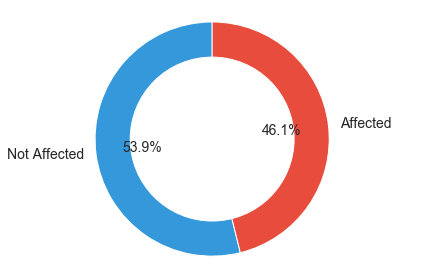

In [0]:
affected = df[(df["target"]==1)].count()[0]
not_affected = df[(df["target"]==0)].count()[0]
tot = df.count()[0]

import matplotlib.pyplot as plt
# Pie chart
labels = ['Not Affected', 'Affected']
sizes = [not_affected/tot, affected/tot]
#colors
flatui_simple = ["#3498db", "#e74c3c"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = flatui_simple, labels=labels, autopct='%1.1f%%', startangle=90,
        textprops={'fontsize': 14})
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()

Note that the majority of samples in our dataset are about people who never had some kind of heart disease.<br>
We have 160 samples of Not Affected vs 137 of Affected People. By the way, this is not a strong predominance.

### Sex Distribution

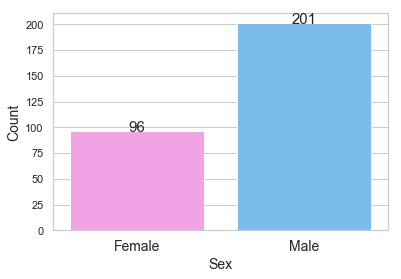

In [0]:
sex_pal = ["#ff96ef", "#68bfff"]
ax = sns.countplot(x='sex',data=df, palette=sns.color_palette(sex_pal));
ax.set_xticklabels(labels=['Female','Male'], fontsize=14);
ax.set_xlabel("Sex",fontsize=14); ax.set_ylabel("Count",fontsize=14);

for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 4), textcoords = 'offset points', fontsize = 15)

Dataset samples are for the majority relative to male patients. Male are more than twice the Female. Our data distribution is biased.

### Affected/Not Affected count w.r.t Sex

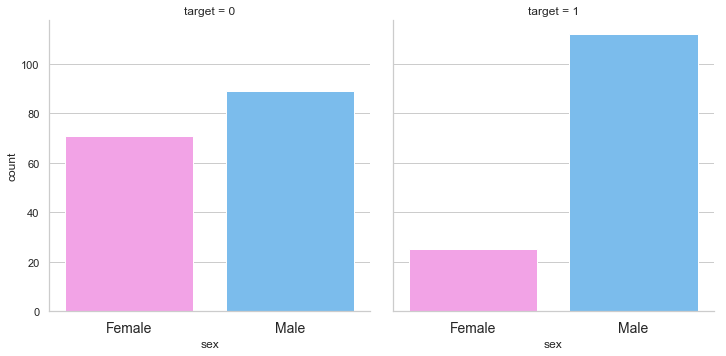

In [0]:
ax1 = sns.catplot(x='sex', col='target', kind='count', data=df, palette=sns.color_palette(sex_pal), estimator=lambda x: len(x));
ax1.set(xticks=[0, 1], xticklabels=['Female', 'Male']);
ax1.set_xticklabels(fontsize=14);

In [0]:
# 1 is for male
# 0 is for female
aff_male = df[(df["target"]==1) & (df["sex"]==1)].count()[0]
aff_female = df[(df["target"]==1) & (df["sex"]==0)].count()[0]
num_male = df[df["sex"]==1].count()[0]
num_female = df[df["sex"]==0].count()[0]
print("Total number of Male subjects is: %d" % num_male)
print("Total number of Female subjects is: %d" % num_female)
print("Number of Heart Diseases Affected male is: %d on %d" % (aff_male, num_male))
print("Number of Heart Diseases Affected female is: %d on %d" % (aff_female, num_female))
male_rate = 100*(aff_male/num_male)  # affected rate for male
female_rate = 100*(aff_female/num_female)  # affected rate for female
print("")
print("Percentage of affected Male: %.02f%% " % male_rate)
print("Percentage of affected Female: %.02f%% " % female_rate)

Total number of Male subjects is: 201
Total number of Female subjects is: 96
Number of Heart Diseases Affected male is: 112 on 201
Number of Heart Diseases Affected female is: 25 on 96

Percentage of affected Male: 55.72% 
Percentage of affected Female: 26.04% 


As we expected the **most affected by heart diseases are Male subjects**. Note that even if our dataset has more than twice male samples w.r.t female ones, more than the half man samples have some kind of heart disease.

### Age distribution

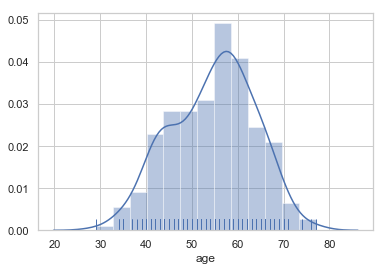

In [0]:
# rug plot draws a small vertical tick at each observation
sns.distplot(df['age'], kde=True, rug=True);

### Age-Target
Quantitative data that we have used is the **age**, and we are comparing it to the categorical variable **target**.

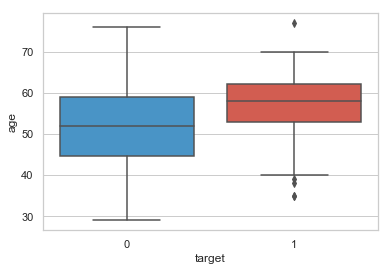

In [0]:
sns.boxplot(x='target',y='age',data=df, palette=sns.color_palette(flatui_simple));

Is interesting to note that the majority of heart diseases affected patient have an AVG age (~60)<br>
Seems that Heart Diseases are more likely to affect people around sixty years old. From the boxplot is also evident the presence of outliers in Target=1 case.<br> The majority of Target-1 outliers have an age between 25 and 40 years old.

### Thalach
Thalach attribute represents the **Maximum heart rate** achieved during thalium stress test.

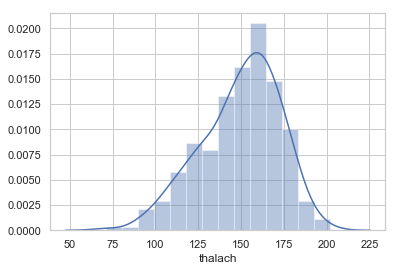

In [0]:
sns.distplot(df['thalach'], kde=True, rug=False);

### Thalach-Target

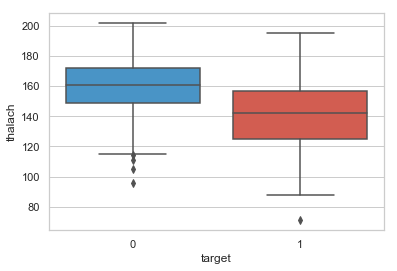

In [0]:
# 'thalach' represents Thalium Test maximum heart rate achieved
sns.boxplot(x='target',y='thalach',data=df, palette=sns.color_palette(flatui_simple));

### Trestbps
Resting blood pressure. Measured in (mm Hg).

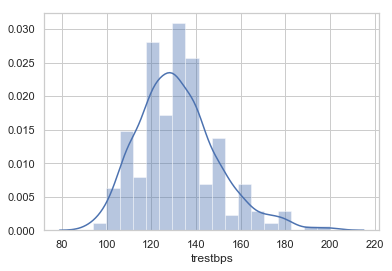

In [0]:
sns.distplot(df['trestbps'], kde=True, rug=False);

### Trestbps-Target

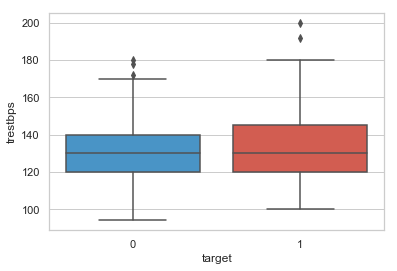

In [0]:
sns.boxplot(x=df['target'], y=df['trestbps'], palette=sns.color_palette(flatui_simple));

Trestbps seems not to be an important feature to discriminate between H.D. affected and Not affected patients.

### Chol
Serum cholesterol. Measured in (mg/dl).

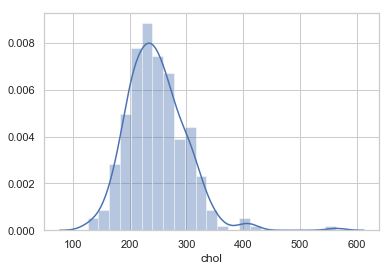

In [0]:
sns.distplot(df['chol'], kde=True, rug=False);

### Chol-Target

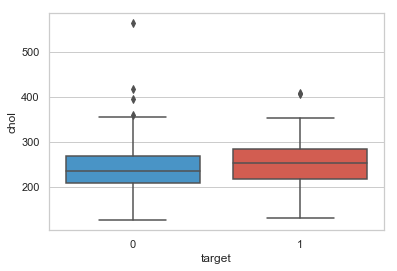

In [0]:
sns.boxplot(x=df['target'], y=df['chol'], palette=sns.color_palette(flatui_simple));

### CP: Chest Pain Type
From UCI Dataset description, this feature can assume 4 different values listed below:
> Value 1: typical angina<br>
> Value 2: atypical angina<br>
> Value 3: non-anginal pain<br>
> Value 4: asymptomatic<br> 

In [0]:
cp_unique = df.cp.unique()
cp_unique.sort()
# counting
print("'Chest Pain Type' feature unique values are: ", cp_unique)
df.cp.value_counts()

'Chest Pain Type' feature unique values are:  [1. 2. 3. 4.]


4.0    142
3.0     83
2.0     49
1.0     23
Name: cp, dtype: int64

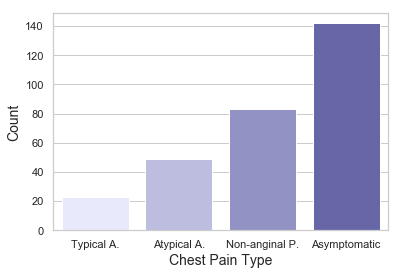

In [0]:
ax = sns.countplot(x='cp',data=df, palette=sns.light_palette("navy"));
ax.set_xticklabels(labels=['Typical A.','Atypical A.', 'Non-anginal P.', 'Asymptomatic']);
ax.set_xlabel("Chest Pain Type",fontsize=14); ax.set_ylabel("Count",fontsize=14);

### CP with respect to Target

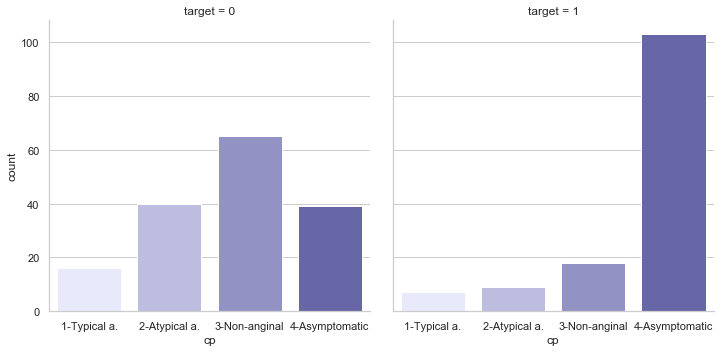

In [0]:
k = sns.catplot(x='cp', col='target', kind='count', data=df,  palette=sns.light_palette("navy"));
k.set(xticks=[0, 1, 2, 3], xticklabels=['1-Typical a.', '2-Atypical a.', '3-Non-anginal', '4-Asymptomatic']);

TODO: Considerations on Chest Pain Type here!

### Thal
Stands for Thalium stress test result (normal, fixed defect, or reversible defect)<br>
> Value 3: normal<br>
> Value 6: fixed defect<br>
> Value 7: reversible defect<br>

In [0]:
thal_unique = df.thal.unique()
thal_unique.sort()
print("'Thal' feature unique values are: ", thal_unique)
print()
df.thal.value_counts()


'Thal' feature unique values are:  [3. 6. 7.]



3.0    164
7.0    115
6.0     18
Name: thal, dtype: int64

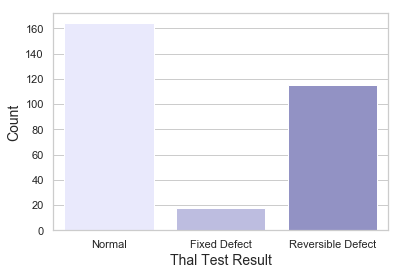

In [0]:
n = sns.countplot(x='thal',data=df, palette=sns.light_palette("navy"));
n.set_xticklabels(labels=['Normal', 'Fixed Defect', 'Reversible Defect']);

#n.set_xticklabels(ax.get_xticklabels(), rotation=10, ha="right")  # xtickslabels rotation
#n.set_xticklabels(ax.get_xticklabels(), fontsize=10)  # xtickslabels font size

n.set_xlabel("Thal Test Result",fontsize=14); n.set_ylabel("Count",fontsize=14);

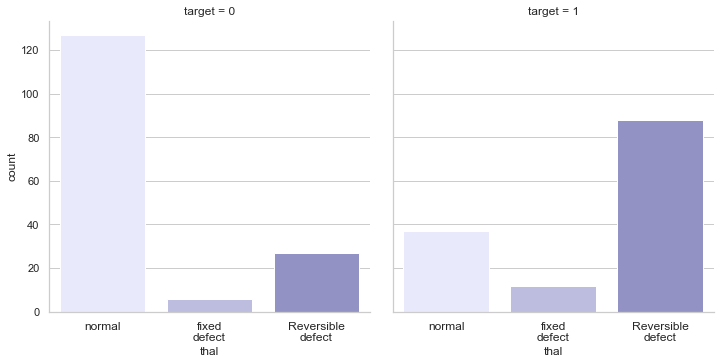

In [0]:
m = sns.catplot(x='thal', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
m.set(xticklabels=['normal', 'fixed\ndefect', 'Reversible\ndefect']);
m.set_xticklabels(fontsize=12);

It's evident from the histograms above that the **majority of Heart Disease affected** samples are characterized by a **Thalium Stress Test Result of 'type 7'** - Reversible Defect.

### FBS
Fasting Blood Sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)

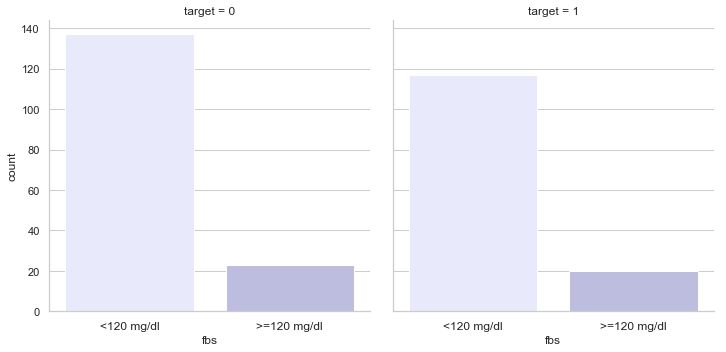

In [0]:
x = sns.catplot(x='fbs', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1], xticklabels=['<120 mg/dl', '>=120 mg/dl']);
x.set_xticklabels(fontsize=12);

### Restecg
Resting electrocardiographic results. Values:<br>
>**Value 0**: normal<br>
>**Value 1**: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)<br>
>**Value 2**: showing probable or definite left ventricular hypertrophy by Estes' criteria<br>

In [0]:
restecg_unique = df.restecg.unique()
restecg_unique.sort()
print("'restecg' feature unique values are: ", restecg_unique)
print()
df.restecg.value_counts()

'restecg' feature unique values are:  [0. 1. 2.]



0.0    147
2.0    146
1.0      4
Name: restecg, dtype: int64

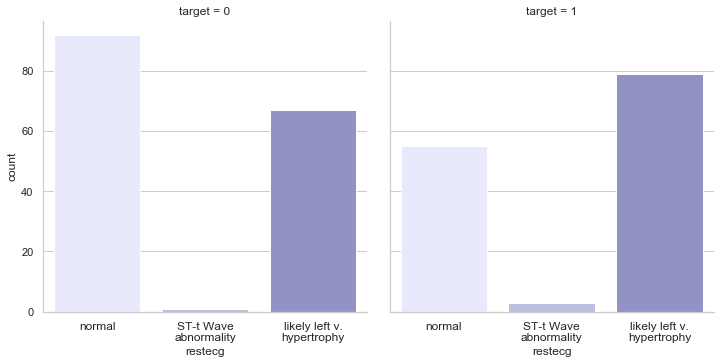

In [0]:
x = sns.catplot(x='restecg', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1, 2], xticklabels=['normal', 'ST-t Wave\nabnormality', 'likely left v.\nhypertrophy']);
x.set_xticklabels(fontsize=12);

In [0]:
tot_abn = (df['restecg'] == 1).sum()
tot_abn_affected = ((df['target'] == 1) & (df['restecg'] == 1)).sum()
print("Number of Patient having ST-T wave abnormality: ", tot_abn)
print("Number of Patient having ST-T wave abnormality that are Affected: ", tot_abn_affected)

Number of Patient having ST-T wave abnormality:  4
Number of Patient having ST-T wave abnormality that are Affected:  3


Note that our dataset contains only 4 samples in which Resting Electrocardiographic result (restecg) is of type 1, so having ST-T wave abnormality.<br>
Of these 4 samples, 3 are about heart disease affected patients (75%).

### Exang
Exercise induced angina (1=yes or 0=no)	

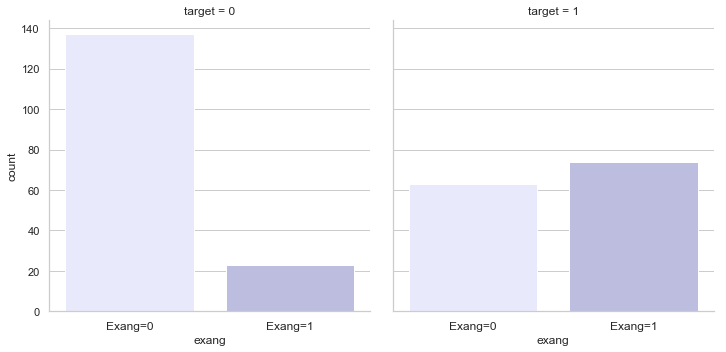

In [0]:
x = sns.catplot(x='exang', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1], xticklabels=['Exang=0', 'Exang=1']);
x.set_xticklabels(fontsize=12);

### Oldpeak
ST depression induced by exercise relative to rest

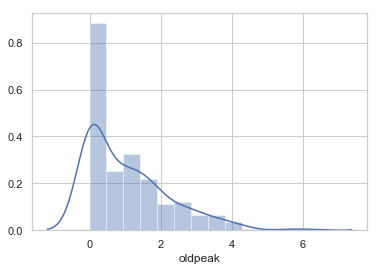

In [0]:
sns.distplot(df['oldpeak'], kde=True, rug=False);

### Slope
The slope of the peak exercise ST segment. Heart Rate slope during peak exercise. Values:<br>
>**Value 1**: downsloping<br>
>**Value 2**: flat<br>
>**Value 3**: upsloping<br>

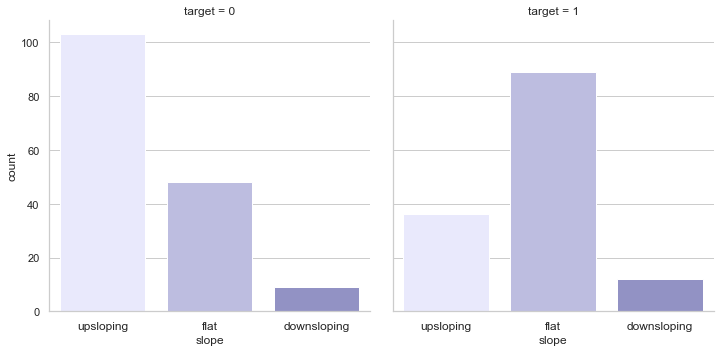

In [0]:
l=sns.catplot(x='slope', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
l.set(xticklabels=['upsloping', 'flat', 'downsloping']);
l.set_xticklabels(fontsize=12);

### CA
When fluoroscopy is used during a cardiac catheterization, the physician can see how blood is moving through the blood vessels and where there are blockages.<br>
Number of major vessels **(0-3)** colored by flourosopy 

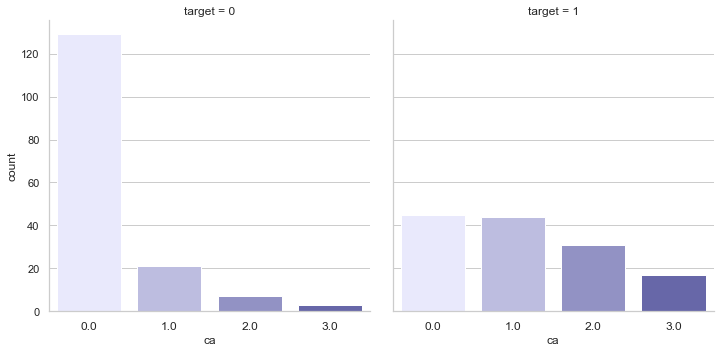

In [0]:
m=sns.catplot(x='ca', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
m.set_xticklabels(fontsize=12);

### Correlation Matrix

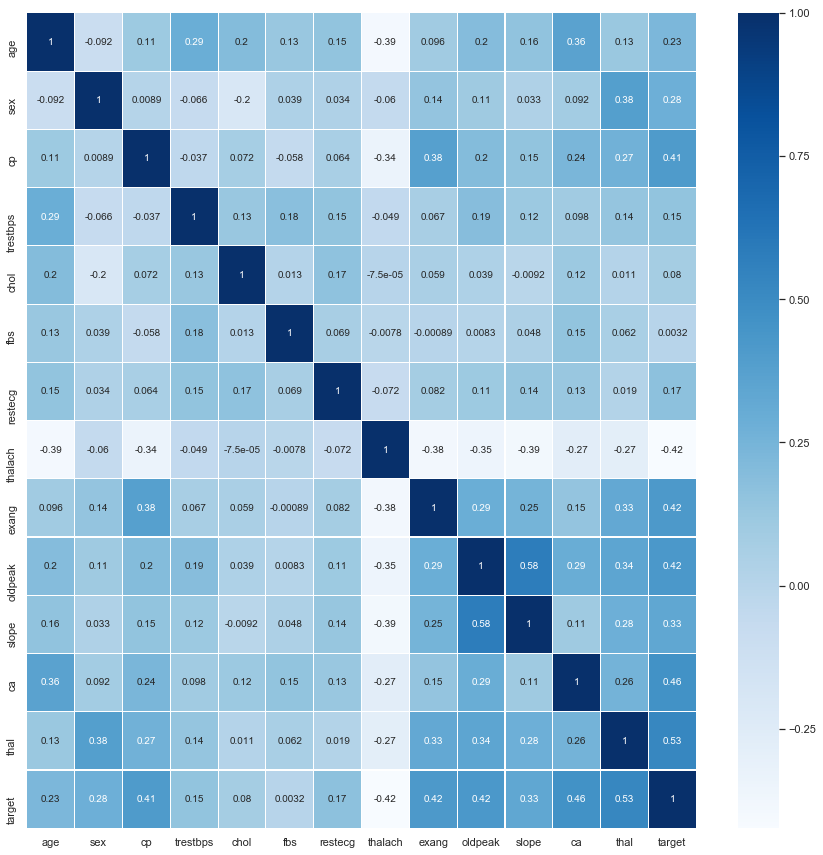

In [0]:
plt.figure(figsize=(15,15))
g=sns.heatmap(df.corr(), annot = True, cmap='Blues',linewidths=.1)
plt.show()

## 2. Preprocessing

In [0]:
pd.options.display.max_colwidth = 150
features_table = pd.read_csv("AlliDataScience/datasets/features_heart.csv")
#features_table = pd.read_csv("datasets/features_heart.csv")
print("Not encoded features: ")
display(features_table)

Not encoded features: 


,Extracted Feature,Type,Description
0,age,Continuous,Age in years
1,sex,Binary,1 = male; 0 = female
2,cp,Categorical,"Chest pain type (typical angina, atypical angina, non-anginal, asymptomatic angina)"
3,trestbps,Continuous,Resting blood pressure (in mm Hg)
4,chol,Continuous,Serum cholesterol (in mg/dl)
5,fbs,Binary,"Fasting blood sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)"
6,restecg,Categorical,"0:normal, 1: ST-T wave abnormality, 2:left ventricular hypertrophy"
7,thalach,Continuous,Maximum heart rate achieved during thalium stress test
8,exang,Binary,"Exercise induced angina (1 = yes, 0 = no)"
9,oldpeak,Continuous,ST depression induced by exercise relative to rest


### OneHot Encoding

As we have seen our dataset contains some categorical data. In our specific case each categorical data value represents a different category, with no ordinal relationship. Some classification algorithms can work directly with categorical data others don't.<br>
e.g Decision Trees can be learned directly from categorical data with no data transformation required (note that this depends on the specific implementation but scikit-learn one does).<br>
At the same time many machine learning algortihms do not handle categorical features at all. They require all input variables and output variables to be numeric. In this case we have to preprocess manually the categorical features, in order to have them in an appropriate format for the machine learning model (usually: numeric features).<br>
<br>
Because of the **lack of ordinal relationship between categorical values**, I don't want the model to assume a natural order between categories. For this reason I've chosen to use a OneHot encoder instead of an Integer/Label encoder.<br><br>
One hot encoding is a representation of categorical variables as binary vectors:
- You'll have as many columns as you have cardinalities (values) in the categorical variable.<br>
- You'll have a bunch of zeroes and only few 1s! (one 1 per new feature)<br>

OneHot Encoding Example:<br>
<img src="https://i.ibb.co/MRsTfnD/onehot-example.jpg" alt="onehot-example" width="320" border="0">

Our dataset **categorical** features are:
1. cp
2. restecg
3. slope
4. thal

In [0]:
# OneHot Encoding
# pandas.get_dummies() is actually OneHot encoding
categorical_features = ['cp', 'restecg', 'slope', 'thal']
for feature in categorical_features:
    num_classes = len(df[feature].unique())
    curr_onehot = pd.get_dummies(df[feature], prefix='enc_' + feature)
    df = df.drop(feature, axis=1)
    df = df.join(curr_onehot)
print("Columns after encoding: ", df.columns)

Columns after encoding:  Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'ca', 'target', 'enc_cp_1.0', 'enc_cp_2.0', 'enc_cp_3.0', 'enc_cp_4.0',
       'enc_restecg_0.0', 'enc_restecg_1.0', 'enc_restecg_2.0',
       'enc_slope_1.0', 'enc_slope_2.0', 'enc_slope_3.0', 'enc_thal_3.0',
       'enc_thal_6.0', 'enc_thal_7.0'],
      dtype='object')


### Dataset Standardization

Standardizing our dataset features by removing the mean and scaling to unit variance.
The standard score of a sample x is calculated as:
$$
\begin{array}{rrl}
\\
z = \frac{x-\mu}{\theta}
\end{array}$$<br>
where $\mu$ is the mean of the training samples, and $\theta$ is the standard deviation of the training samples.<br>
Standardization of a dataset is a common requirement for many machine learning estimators: they might behave badly if the individual features do not more or less look like standard normally distributed data (e.g. Gaussian with 0 mean and unit variance).<br>
For instance many elements used in the objective function of a learning algorithm (such as the RBF kernel of Support Vector Machines or the L1 and L2 regularizers of linear models) assume that all features are centered around 0 and have variance in the same order. If a feature has a variance that is orders of magnitude larger that others, it might dominate the objective function and make the estimator unable to learn from other features correctly as expected.

In [0]:
from sklearn.preprocessing import StandardScaler
y = df["target"].values
X = df.drop("target", axis=1).values  # from encoded dataframe, no target column, no normalization yet
X_std = StandardScaler(with_mean=True, with_std=True).fit_transform(X)  # Normalization: Mean=0; Variance=1

### Principle Component Analysis - 2 PCs

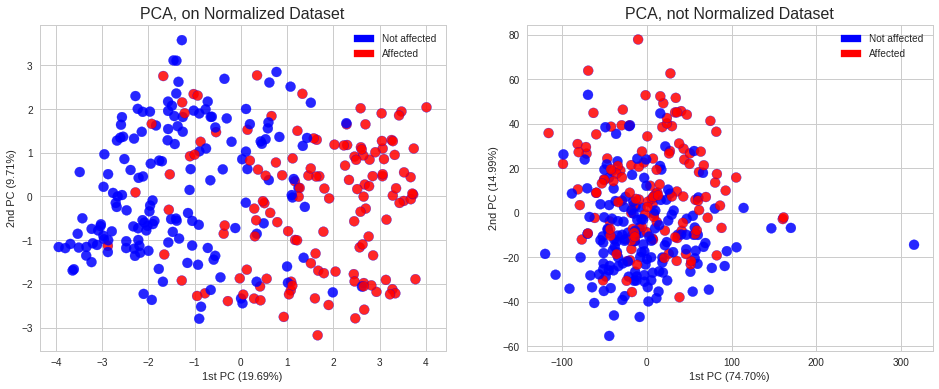

In [0]:
from sklearn.decomposition import PCA
import matplotlib.patches as mpatches

pca, pca1 = PCA(n_components=2), PCA(n_components=2) # all components
X_t = pca.fit_transform(X_std)  # with normalization
X_t1 = pca1.fit_transform(X)  # without normalization, presence of Outliers, this impact on PC1 p.v.e

# Label to color dict (manual)
label_color_dict = {0: 'blue', 1: 'red'}
# Color vector creation
cvec = [label_color_dict[label] for label in y]
# Legend
negative_patch = mpatches.Patch(color='blue', label='Not affected')
positive_patch = mpatches.Patch(color='red', label='Affected')
# 1st and 2nd Components Scatter
fig = plt.figure(figsize=(16, 6))
ax = fig.add_subplot(121)
ax.set_xlabel('1st PC (%.2f%%)' % (pca.explained_variance_ratio_[0] * 100))
ax.set_ylabel('2nd PC (%.2f%%)' % (pca.explained_variance_ratio_[1] * 100))
ax.set_title('PCA, on Normalized Dataset', fontsize=16)
ax.scatter(X_t[:, 0], X_t[:, 1], c=cvec, edgecolor='b', alpha=0.85, s=100)
ax.legend(handles=[negative_patch, positive_patch])
ax1 = fig.add_subplot(122)
ax1.set_xlabel('1st PC (%.2f%%)' % (pca1.explained_variance_ratio_[0] * 100))
ax1.set_ylabel('2nd PC (%.2f%%)' % (pca1.explained_variance_ratio_[1] * 100))
ax1.set_title('PCA, not Normalized Dataset', fontsize=16)
ax1.scatter(X_t1[:, 0], X_t1[:, 1], c=cvec, edgecolor='b', alpha=0.85, s=100)
ax1.legend(handles=[negative_patch, positive_patch])
plt.show()

## 3. Classification

We first divide the dataset into two parts. One for training, the other one for Test (30%).<br>
For each of the analyzed model we will:
1. Choose model hyperparameters by doing Cross-Validation.
2. Fit the model to the training data.
3. Use the model to predict labels for new data (Test).
4. Compute ROC and Area Under Curve Value.
5. Validation and learning curve w.r.t. specific model and hyperparameters.

#### Utility functions for classification

In [0]:
# utility function for classification
# plot ROC curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
def plot_roc_curve(y_test, y_pred, plot_title):
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    plt.figure(figsize=(7, 5), dpi=80)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.suptitle(plot_title, fontsize=14)
    plt.plot(false_positive_rate, true_positive_rate, color='blue', lw=2, label='ROC - Area Under Curve = %0.3f)' % roc_auc)
    plt.legend(loc="lower right")
    plt.show()

In [0]:
# utility function for learning curve plotting
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, optional (default=None)
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like, shape (n_ticks,), dtype float or int
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the dtype is float, it is regarded as a
        fraction of the maximum size of the training set (that is determined
        by the selected validation method), i.e. it has to be within (0, 1].
        Otherwise it is interpreted as absolute sizes of the training sets.
        Note that for classification the number of samples usually have to
        be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    plt.figure(figsize=(8, 6), dpi=80)
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="cornflowerblue")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="b",
             label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()



### k-Fold Cross-Validation
    

This approach involves randomly dividing the set of observations into k groups, or folds, of approximately equal size. The ﬁrst fold is treated as a validation set, and the method is ﬁt on the remaining k − 1 folds.<br> 
The mean squared error, MSE 1 , is then computed on the observations in the held-out fold. This procedure is repeated k times; each time, a diﬀerent group of observations is treated as a validation set. This process results in k estimates of the test error, MSE 1 , MSE 2 , . . . , MSE k .<br>
The k-fold CV estimate is computed by averaging these values,
$${MSE} = \frac{1}{k}\sum_{i=1}^{k}{MSE}_i$$
When we perform cross-validation, our goal might be to determine how well a given statistical learning procedure can be expected to perform on independent/new data.<br>
For doing this we will use sklearn.model_selection.GridSearchCV function. For each considered model we will get k test scores (note that scores are actually computed on validation sets), one for each fold. By computing the mean of this k scores we obtain "mean_test_score" parameter.

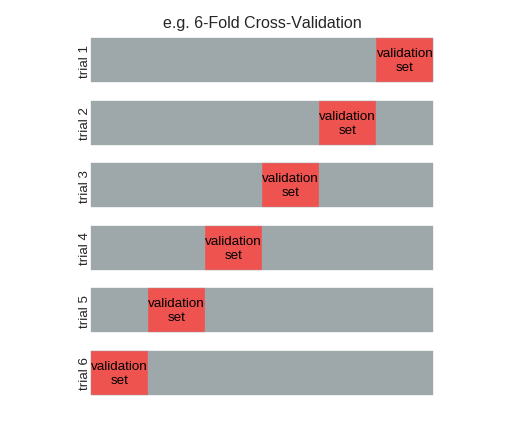

In [0]:
import matplotlib.pyplot as plt
validation_color = "#ef5350"  #"#80e27e"
train_color_light = "#cfd8dc"
train_color_dark = "#9ea7aa"

def draw_rects(N, ax, textprop={}):
    for i in range(N):
        ax.add_patch(plt.Rectangle((0, i), 5, 0.7, fc=train_color_dark, ec=train_color_dark))
        ax.add_patch(plt.Rectangle((5. * i / N, i), 5. / N, 0.7, fc=validation_color, ec=train_color_dark))
        ax.text(5. * (i + 0.5) / N, i + 0.35, "validation\nset", color="black", ha='center', va='center', **textprop)
        ax.text(0, i + 0.35, "trial {0}".format(N - i),
                ha='right', va='center', rotation=90, **textprop)
    ax.set_xlim(-1, 6)
    ax.set_ylim(-0.2, N + 0.2)
    
    
fig = plt.figure(figsize=(6,5), dpi=80)
fig.suptitle("e.g. 6-Fold Cross-Validation")
ax = fig.add_axes([0, 0, 1, 1])
ax.axis('off')
draw_rects(6, ax, textprop=dict(size=12))

### Dataset Split into Training and Test Set

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_std, y, test_size=0.30, random_state=0)
print("X shape before train_test_split: ", X_std.shape)
print("After train_test_split with test_size 30%:")
print("X_train shape: ", X_train.shape)
print("X_test shape: ", X_test.shape)

X shape before train_test_split:  (297, 22)
After train_test_split with test_size 30%:
X_train shape:  (207, 22)
X_test shape:  (90, 22)


### 3.1 K-Nearest Neighbors

K-Nearest Neighbors or K-Nearest Neighbors Vote is a very simple supervised classification algorithm that we can use to assign a class to new data point. It can be used for regression as well, KNN does not make any assumptions on the data distribution, hence it is non-parametric. It keeps all the training data to make future predictions by computing the similarity between an input sample and each training instance.

How it works (pseudocode):
1. Load the training and test data.
2. Choose the value of K.
3. For each point in test data:
 - find the distance to all training data points.
 - store the distances in a list and sort it.
 - choose the first k points.
 - assign a class to the test point based on the majority of classes present in the chosen points (voting phase).

Since we have to compute distances we have also to specify which kind of **metric** we want to use. In our experiments we will use Minkowski distance with $p=2$ which basically corresponds to **Euclidean distance**.<br><br>
**Minkowski distance**:<br>
The Minkowski distance is a generalized form of the Euclidean distance (if p=2) and the Manhattan distance (if p=1).
$$\left(\sum_{i=1}^n |x_i-y_i|^p\right)^{1/p}$$
**Euclidean distance**:<br>
The Euclidean distance is a distance measure between two points or or vectors in a two- or multidimensional (Euclidean) space based on Pythagoras' theorem. The distance is calculated by taking the square root of the sum of the squared pair-wise distances of every dimension.
$$\sqrt{\sum_{i=1}^n (x_i-y_i)^2}$$
**Manhattan distance**:<br>
The Manhattan distance metric is related to the Euclidean distance, but instead of calculating the shortest diagonal path between two points, it calculates the distance based on gridlines.
$$\left(\sum_{i=1}^n |x_i-y_i|^p\right)^{1/p}$$


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

k_values = [1, 2, 3, 10, 20, 30, 40, 50, 70, 100, 189]

#weights_values = ["uniform", "distance"]
#tuned_parameters = {'n_neighbors': k_values, 'weights': weights_values}
tuned_parameters = {'n_neighbors': k_values}

knn_cv = GridSearchCV(KNeighborsClassifier(), tuned_parameters , cv=12, refit=True, return_train_score=True)
knn_cv.fit(X_train, y_train)

print('GridSearchCV 12-Fold on Training Set')
print('CV - Best Parameters are: ', knn_cv.best_params_)

# Mean cross-validated score of the best_estimator
accuracy = 100 * float(knn_cv.best_score_)
print('CV - Best Accuracy Score (AVG on all folds scores) is: %.03f%% ' % accuracy)

# best estimator is accessible by "clf.best_estimator_" if refit=TRUE
print()
print("Using best parameters retrieved by 12-fold CV on Test Set:")
y_pred = knn_cv.best_estimator_.predict(X_test)

test_score = 100 * metrics.accuracy_score(y_test, y_pred) 
knn_f_score = metrics.f1_score(y_test, y_pred) # F-Score

print("knn_cv - With best params from GridSearchCV [n_neighbors=%d]\nAccuracy Score on Test Set is %.2f%%\nF-Score is %.2f" %
      (knn_cv.best_params_['n_neighbors'], test_score,knn_f_score))


GridSearchCV 12-Fold on Training Set
CV - Best Parameters are:  {'n_neighbors': 70}
CV - Best Accuracy Score (AVG on all folds scores) is: 84.058% 

Using best parameters retrieved by 12-fold CV on Test Set:
knn_cv - With best params from GridSearchCV [n_neighbors=70]
Accuracy Score on Test Set is 84.44%
F-Score is 0.82


In [0]:
y_test_knn=y_test
y_pred_knn=y_pred

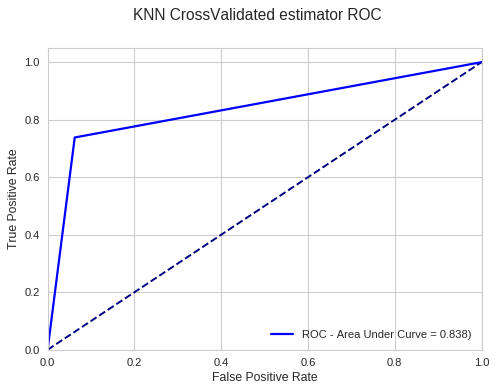

In [0]:
plot_roc_curve(y_test_knn, y_pred_knn, "KNN CrossValidated estimator ROC")

#### GridSearch Table
- **Number of folds** for Cross-Validation: 12 <br> 
- **mean_test_score** is the average of Test Scores on all k=12 folds. <br>
- **mean_train_score** is the average of Train Scores on all k=12 folds. <br>

When doing k-fold cross-validation, for each parameters combination possible, we train $\textit{k}$ models, each one leaving $1/\textit{k}$ portion of the data out. For each of the models, its train error and validation error is computed. The train error will be the error on the data selected to train the model, and the validation error will be computed on the data left out of the training.<br>
For this reason, for each parameters set, we have $\textit{k}$ training errors and $\textit{k}$ validation/test errors, by computing their averages we get respectively $\textit{mean_train_score}$ and $\textit{mean_test_score}$ for each parameters set/combination.

best parameters: {'n_neighbors': 70}
best score:      0.84058 (+/-0.10341)
{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 70,
 'p': 2,
 'weights': 'uniform'}


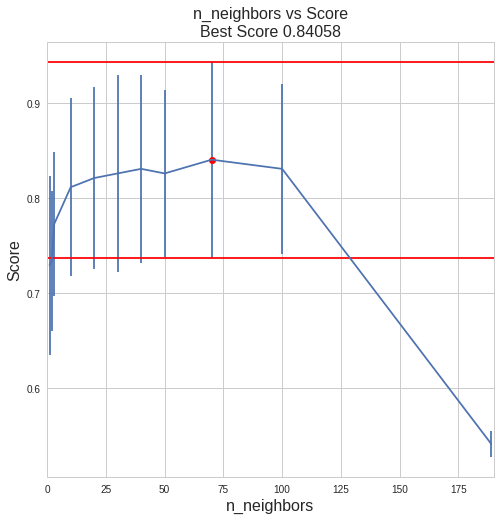

In [0]:
GridSearch_table_plot(knn_cv, "n_neighbors", negative=False, display_table = False);

#### Consideration on GridSearch plot (above)
By increasing significantly the number of nearest neighbors considered, classification perfomance of our model decreases.<br>
At some point, depending on different class samples cardinality in our dataset, our model will always choose for the majority class, which is 'Not Affected' (160 not affected vs 137 affected). Since Not Affected and Affected classes represent respectively  ~54% and ~46% of samples, by increasing the value of n_neighbors parameter, at a certain point  ( $\textit{n_neighbors}$ >= 189 if we use 30% test split size ) our KNN model accuracy will be ~0.54%, always predicting for the majority class, so Not Affected.<br>


#### KNN Validation Curve - 'n_neighbors' parameter

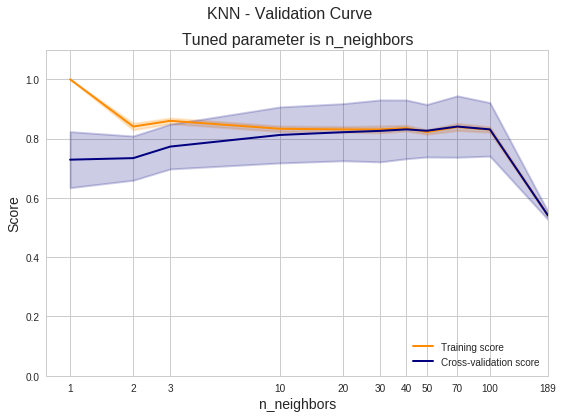

In [0]:
from sklearn.model_selection import validation_curve
import numpy as np
# Validation curve linear - parameters
# Linear Kernel
fig = plt.figure(figsize=(9, 6), dpi=72);
fig.suptitle('KNN - Validation Curve', fontsize=16)

#plot sx
ax = fig.add_subplot(111)
train_scores, test_scores = validation_curve(
    KNeighborsClassifier(), X_train, y_train, param_name="n_neighbors", param_range=k_values,
    cv=12, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax.set_title("Tuned parameter is n_neighbors", fontsize=16)
ax.set_xlabel("n_neighbors", fontsize=14)
ax.set_ylabel("Score", fontsize=14)
ax.set_ylim(0.0, 1.1)
lw = 2
ax.semilogx(k_values, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax.fill_between(k_values, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)

ax.semilogx(k_values, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax.fill_between(k_values, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
ax.legend(loc=4);
ax.set_xlim(0,190)
plt.xticks(k_values, k_values)
plt.show()

#### KNN Learning Curve

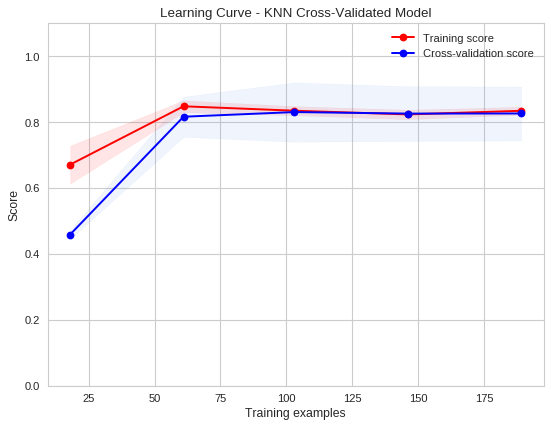

In [0]:
knn=KNeighborsClassifier(n_neighbors=18)
plot_learning_curve(knn, "Learning Curve - KNN Cross-Validated Model", X_train, y_train, ylim=(0.0, 1.10), cv=12, n_jobs=-1)

#### KNN Scores

##### Cross-Validation Scores

In [0]:
#['params', 'rank_test_score', 'mean_train_score', 'mean_test_score'])
df_knn_cv = pd.DataFrame(knn_cv.cv_results_)
cv_mean_train_scores = 100*(df_knn_cv['mean_train_score'].values)  # df is actually sorted by "param_n_neighbors"
cv_mean_test_scores = 100*(df_knn_cv['mean_test_score'].values)
df_knn_cv = df_knn_cv[['param_n_neighbors', 'rank_test_score','mean_train_score','mean_test_score']].sort_values(by=['rank_test_score'])
display(df_knn_cv)

,param_n_neighbors,rank_test_score,mean_train_score,mean_test_score
8,70,1,0.839264,0.840580
6,40,2,0.835310,0.830918
9,100,2,0.830483,0.830918
5,30,4,0.830919,0.826087
7,50,4,0.822133,0.826087
4,20,6,0.830914,0.821256
3,10,7,0.833114,0.811594
2,3,8,0.859906,0.772947
1,2,9,0.840580,0.734300
0,1,10,1.000000,0.729469


##### Scores on Test Set

In [0]:
k_test_scores = []  # scores on Test Set for different K values, with 'uniform' weights
clf_vect = []  # vector containing fitted classifier for each k value
for k in k_values:
    curr_clf = KNeighborsClassifier(n_neighbors=k, weights='uniform')
    curr_clf.fit(X_train, y_train)
    clf_vect.append(curr_clf)
    y_pred = curr_clf.predict(X_test)
    score = 100 * metrics.accuracy_score(y_test, y_pred)
    k_test_scores.append(score)

##### Interactive KNN Test Scores Plot

In [0]:
trace0 = Scatter(
    x = k_values,
    y = k_test_scores,
    mode = 'lines+markers',
    name = '<b>Score on Test Set</b>',
    line = dict(
        color = ('rgb(255,0,0)'), # red
        width = 4)
      )

trace1 = Scatter(
    x = k_values,
    y = cv_mean_train_scores,
    #mode = 'lines+markers',
    mode = 'lines',
    name = 'Mean Train Score',
    line = dict(
        color = ('rgb(49,130,189)'), # light blue
        width = 4)
      )
trace2 = Scatter(
    x = k_values,
    y = cv_mean_test_scores,
    mode = 'lines+markers',
    name = 'Mean Test Score',
    line = dict(
        color = ('rgb(47,79,79)'), # grey
        width = 3)
      )

configure_plotly_browser_state()
init_notebook_mode(connected=False)
# subplot style
fig = tools.make_subplots(rows=3, cols=1,subplot_titles=
                          ('<b>Cross-Validation Train Scores</b>',
                           '<b>Cross-Validation Test Scores</b>',
                           '<b>Test Set Scores</b>'), shared_xaxes=True)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace0, 3, 1)
fig['layout'].update(title='KNN Scores', width = 1024, height = 768)
fig['layout']['xaxis'].update(title='n_neighbors') #shared axis X
iplot(fig, filename='stacked-knn-scores')

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



### 3.2 Support Vector Machine

A support vector machine constructs a hyper-plane or set of hyper-planes in a high or infinite dimensional space, which can be used for classification, regression or other tasks. Intuitively, a good separation is achieved by the hyper-plane that has the largest distance to the nearest training data points of any class (so-called functional margin), since in general the larger the margin the lower the generalization error of the classifier.

#### Decision Hyper-Plane

A hyper plane in an n-D feature space can be represented by the following equation: $$f({\bf x})={\bf x}^T {\bf w}+b=\sum_{i=1}^n x_i w_i+b=0$$ <br>
The n-D space is partitioned into two regions by the plane. Specifically, we define a mapping function $y=sign(f({\bf x})) \in \{1,-1\}$,
$$f({\bf x})={\bf x}^T {\bf w}+b=\left\{ \begin{array}{ll} >0, & 
  y=sign(f({\bf x}))=1,\;{\bf x}\in P  \\
  <0, &  y=sign(f({\bf x}))=-1,\;{\bf x}\in N \\
\end{array} \right. $$
<br>
Any point ${\bf x}\in P$ on the positive side of the plane is mapped to 1,
while any point ${\bf x}\in N$ on the negative side is mapped to -1. A point ${\bf x}$ of unknown class will be classified to P if $f({\bf x})>0$, or N if $f({\bf x})<0$.

#### Hard Margin SVM

<br><img src="http://svm.michalhaltuf.cz/wp-content/uploads/2017/10/margin.png" alt="Hard Margin SVM" width="320" align="center"><br>
For a decision hyper-plane ${\bf x}^T {\bf w}+b=0$ to separate the two 
classes $P=\{({\bf x}_i,1)\}$ and $N=\{({\bf x}_i,-1)\}$, it has to
satisfy
\begin{eqnarray}
	\nonumber \\
&	& y_i ({\bf x}_i^T{\bf w}+b) \ge 0
\end{eqnarray}<br>
for both ${\bf x}_i \in P$ and ${\bf x}_i \in N$. Among all such planes 
satisfying this condition, we want to find the optimal one $H_0$ that 
separates the two classes with the maximal margin (the distance between 
the decision plane and the closest sample points).
Our goal is to maximize this distance (*margin*), or, equivalantly, to minimize the 
norm $||{\bf w}||$. Now the problem of finding the optimal decision plane 
in terms of ${\bf w}$ and $b$ can be formulated as:
\begin{eqnarray}
  &	\mbox{minimize} & \frac{1}{2}{\bf w}^T {\bf w}=\frac{1}{2}||{\bf w}||^2 
  \;\;\;\;\;\;\mbox{(objective function)}	\nonumber \\
  &	\mbox{subject to} & y_i ({\bf x}_i^T {\bf w}+b) \ge 1,\;\; (i=1,\cdots,m)
  \nonumber
\end{eqnarray}
<br>
Since the objective function is quadratic, this constrained optimization
problem is called a quadratic program (QP) problem. This QP 
problem can be solved by Lagrange multipliers method to minimize the following Lagrange function: 
$$L_p({\bf w},b,{\bf \alpha})=\frac{1}{2}||{\bf w}||^2
-\sum_{i=1}^m \alpha_i(y_i({\bf x}_i^T{\bf w}+b)-1)$$
with respect to ${\bf w}$, ${\mathit{b}}$ and the Lagrange coefficients $\alpha_i\ge 0$  $(i=1,\cdots,\alpha_m)$.<br>
Optimality in ${\bf w}$, ${\mathit{b}}$ is at a saddle point with ${\bf alpha}$.<br>
Derivatives ${\bf w}$, ${\mathit{b}}$ need to vanish, this leads to the two following terms:
$$	{\bf w}=\sum_{j=1}^m \alpha_j y_j {\bf x}_j,\;\;\;\mbox{and}\;\;\;\;
	\sum_{i=1}^m \alpha_i y_i=0	$$<br>
Plugging terms back into Lagrange function we get the dual problem:
\begin{eqnarray}
& 	\mbox{maximize} & L_d({\bf \alpha})=
	\sum_{i=1}^m\alpha_i -\frac{1}{2}
	\sum_{i=1}^m \sum_{j=1}^m \alpha_i \alpha_j y_i y_j {\bf x}_i^T,{\bf x}_j
	\nonumber \\
&	\mbox{subject to} & \alpha_i\ge 0,\;\;\;\;
	\sum_{i=1}^m \alpha_i y_i=0	\nonumber
\end{eqnarray}

#### Soft Margin SVM

<br><img src="https://www.researchgate.net/profile/Marimuthu_Palaniswami/publication/220606206/figure/fig2/AS:339477512900611@1457949154899/The-soft-margin-SVM-classifier-with-slack-variables-x-and-support-vectors-shown.png" alt="Soft Margin SVM" width="400" align="center"><br><br>
When the two classes are not linearly separable, the condition for the optimal hyper-plane can be relaxed by including an extra term:
\begin{eqnarray}
	\nonumber \\
&	& y_i ({\bf x}_i^T{\bf w} +b) \ge 1-\xi_i,\;\;\;(i=1,\cdots,m)
\end{eqnarray}<br>
For minimum error, $\xi_i \ge 0$ should be minimized as well as $||{\bf w}||$,
and the objective function becomes:
\begin{eqnarray}
&	\mbox{minimize} & {\bf w}^T {\bf w}+C\sum_{i=1}^m \xi_i^k
	\nonumber \\
&	\mbox{subject to} & y_i ({\bf x}_i^T {\bf w}+b) \ge 1-\xi_i,
	\;\;\;\mbox{and}\;\;\;\xi_i \ge 0;\;\;\;(i=1,\cdots,m)
	\nonumber
\end{eqnarray}<br><br>
$C$ is a regularization parameter that controls the trade-off between 
maximizing the margin and minimizing the training error. Small C tends to 
emphasize the margin while ignoring the outliers in the training data, while
large C may tend to overfit the training data.<br>
By controlling the k-value we can impose:
- with k = 1, 1-norm soft margin problem, in general is less sensible w.r.t. outliers
- with k = 2, 2-norm soft margin problem

#### Kernel Trick

If the data set is not linearly separable, we can map the samples ${\bf x}$ 
into a feature space of higher dimensions:
\begin{eqnarray}
	\nonumber \\
&	& {\bf x} \longrightarrow \phi({\bf x})	
\end{eqnarray}<br>
in which the classes can be linearly separated. The decision function in 
the new space becomes:
\begin{eqnarray}
	\nonumber \\
&	f({\bf x})=\phi({\bf x})^T {\bf w}+b=
\sum_{j=1}^m \alpha_j y_j (\phi({\bf x})^T \phi({\bf x}_j))+b	
\end{eqnarray}<br>
where 
${\bf w}=\sum_{j=1}^m \alpha_j y_j \phi({\bf x}_j)	$
and $b$ are the parameters of the decision plane in the new space.<br>
As the vectors ${\bf x}_i$ appear only in inner products in both the decision
function and the learning law, the mapping function $\phi({\bf x})$ does not 
need to be explicitly specified. Instead, all we need is the inner 
product of the vectors in the new space. The function $\phi({\bf x})$ is a 
kernel-induced *implicit* mapping.
<br><br>
**Definition**: A kernel is a function that takes two vectors ${\bf x}_i$ 
and ${\bf x}_j$ as arguments and returns the value of the inner product of
their images $\phi({\bf x}_i)$ and $\phi({\bf x}_j)$:
\begin{eqnarray}
	\nonumber \\
&	& K({\bf x}_1,{\bf x}_2)=\phi({\bf x}_1)^T\phi({\bf x}_2)	
\end{eqnarray}<br>
As only the inner product of the two vectors in the new space is returned,
the dimensionality of the new space is not important.<br>
The learning algorithm in the kernel space can be obtained by replacing
all inner products in the learning algorithm in the original space with 
the kernels:
\begin{eqnarray}
	\nonumber \\
&	& f({\bf x})=\phi({\bf x})^T {\bf w}+b=\sum_{j=1}^m \alpha_j y_j K({\bf x},{\bf x}_j)+b	
\end{eqnarray}
The parameter $b$ can be found from any support vectors ${\bf x}_i$:
$$b=y_i-\phi({\bf x}_i)^T {\bf w}=y_i-\sum_{j=1}^m  \alpha_j y_j 
(\phi({\bf x}_i)^T \phi({\bf x}_j))=y_i-\sum_{j=1}^m  \alpha_j y_j K({\bf x}_i,{\bf x}_j)$$
<br><br>
*Linear kernel*:<br>
Assume ${\bf x}=[x_1,\cdots,x_n]^T$, ${\bf z}=[z_1,\cdots,z_n]^T$,
\begin{eqnarray}
	\nonumber \\
&	& K({\bf x},{\bf z})={\bf x}^T {\bf z}=\sum_{i=1}^n x_1z_1	
\end{eqnarray}<br>
*Polynomial kernels*:<br>
Assume ${\bf x}=[x_1,x_2]^T$, ${\bf z}=[z_1,z_2]^T$, 
\begin{eqnarray}
	K({\bf x},{\bf z})=({\bf x}^T{\bf z})^2&=&(x_1z_1+x_2z_2)^2
        =x_1^2z_1^2+x_2^2z_2^2+2x_1z_1x_2z_2
	\nonumber \\
	&=&<(x_1^2,x_2^2,\sqrt{2}x_1x_2),(z_1^2,z_2^2,\sqrt{2}z_1z_2)>
	=\phi({\bf x})^T \phi({\bf z})
	\nonumber
\end{eqnarray}
This is a mapping from a 2-D space to a 3-D space. The order can be changed 
from 2 to general d.




#### SVM parameters Tuning - CrossValidation

In [0]:
# Tuning Parameters
kernels = ["rbf", "linear", "sigmoid", "poly"]
gammas = [10**-3, 10**-2, 10**-1, 1, 10, 25, 50, 10**2, 10**3]
Cs = [10**-3, 10**-2, 10**-1, 1, 10, 25, 50, 10**2, 10**3]

degrees = [0, 3, 4, 6]
tuned_parameters = {'kernel':kernels, 'C':Cs, 'gamma':gammas}

#tuned_parameters = {'kernel':kernels, 'C':Cs, 'gamma':gammas, 'degree':degrees}
#tuned_parameters = [{'kernel': ['rbf'], 'gamma': [10, 1, 1e-2, 1e-3, 1e-4, 1e-5],
#                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]},
#                    {'kernel': ['sigmoid'], 'gamma': [10, 1, 1e-2, 1e-3, 1e-4, 1e-5],
#                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]},
#                    {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}]

##### Cross-Validation resulting model

In [0]:
from sklearn import svm

# GridSearchCV - 6 fold validation
svm_cv = GridSearchCV(svm.SVC(), tuned_parameters, cv=6, refit=True, return_train_score=True, n_jobs=-1)
svm_cv.fit(X_train, y_train)
print('SVM - GridSearchCV 6-Fold on Training Set.\nBest_params= %s with best_score_= %.03f'%
      (svm_cv.best_params_, 100*float(svm_cv.best_score_)))

SVM - GridSearchCV 6-Fold on Training Set.
Best_params= {'C': 25, 'gamma': 0.1, 'kernel': 'sigmoid'} with best_score_= 83.575


We are using scikit-learn GridSearchCV for doing Cross-Validation. Models with different parameters combination are ranked  by $\textit{mean_test_score}$, which is the mean of the scores of the specific model on all validation folds.<br> In this case we are doing 6-Fold Cross-Validation for choosing the best parameters for our SVM model.
"best_score = 83.575" is the maximum "mean_test_score", in this case achived by the SVM model with {'C': 25, 'gamma': 0.1, 'kernel': 'sigmoid'}.<br>
But this is absolutely not the score of the model on the Test Set. Once found the model giving the maximum cross-validation score (mean_test_score) we see how it goes on the real Test Set.

In [0]:
df_svm_cv = pd.DataFrame(svm_cv.cv_results_)
# selecting only the interesting columns
df_svm_cv = df_svm_cv[['params', 'rank_test_score','mean_train_score','mean_test_score']].sort_values(by=['rank_test_score'])
df_svm_cv.head(10) # show some parameters combination, ordered by rank, first 10 rows

,params,rank_test_score,mean_train_score,mean_test_score
190,"{'C': 25, 'gamma': 0.1, 'kernel': 'sigmoid'}",1,0.752680,0.835749
182,"{'C': 25, 'gamma': 0.001, 'kernel': 'sigmoid'}",2,0.864787,0.830918
49,"{'C': 0.01, 'gamma': 1, 'kernel': 'linear'}",3,0.857052,0.826087
144,"{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}",3,0.861897,0.826087
41,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'linear'}",3,0.857052,0.826087
61,"{'C': 0.01, 'gamma': 50, 'kernel': 'linear'}",3,0.857052,0.826087
53,"{'C': 0.01, 'gamma': 10, 'kernel': 'linear'}",3,0.857052,0.826087
154,"{'C': 10, 'gamma': 0.1, 'kernel': 'sigmoid'}",3,0.751756,0.826087
146,"{'C': 10, 'gamma': 0.001, 'kernel': 'sigmoid'}",3,0.857052,0.826087
37,"{'C': 0.01, 'gamma': 0.001, 'kernel': 'linear'}",3,0.857052,0.826087


SVM CV - best params from GridSearchCV are: [Kernel: sigmoid, C: 25.000 ,gamma: 0.100]
Accuracy Score on Test Set is: 75.56%
F-Score is: 0.74


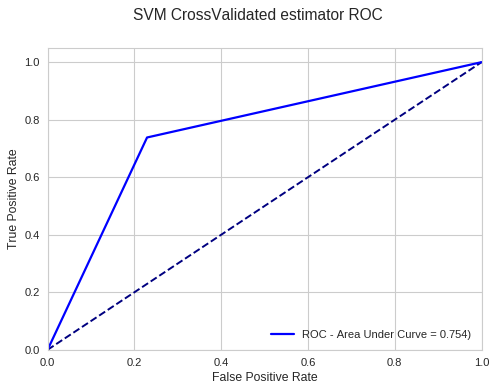

In [0]:
# best estimator is accessible by "clf2.best_estimator_" if refit=TRUE
y_pred = svm_cv.best_estimator_.predict(X_test)

score = 100 * metrics.accuracy_score(y_test, y_pred)
svm_f_score = metrics.f1_score(y_test, y_pred) # F-Score

print("SVM CV - best params from GridSearchCV are: [Kernel: %s, C: %.3f ,gamma: %.3f]\nAccuracy Score on Test Set is: %.2f%%\nF-Score is: %.2f" %
      (svm_cv.best_params_['kernel'], svm_cv.best_params_['C'], svm_cv.best_params_['gamma'], score, svm_f_score))
plot_roc_curve(y_test, y_pred, "SVM CrossValidated estimator ROC")

In [0]:
y_pred_svm=y_pred
y_test_svm=y_test

#### SVM Validation Curve

Validation Curves are useful to gain some insight on the influence of a single hyperparameter on the training score and the validation score, to find out whether the estimator is overfitting or underfitting for some hyperparameter values.<br>
If the training score and the validation score are both low, the estimator will be underfitting. If the training score is high and the validation score is low, the estimator is overfitting and otherwise it is working very well. A low training score and a high validation score is usually not possible.<br>
<br>
*(rif: sklearn documentation)*



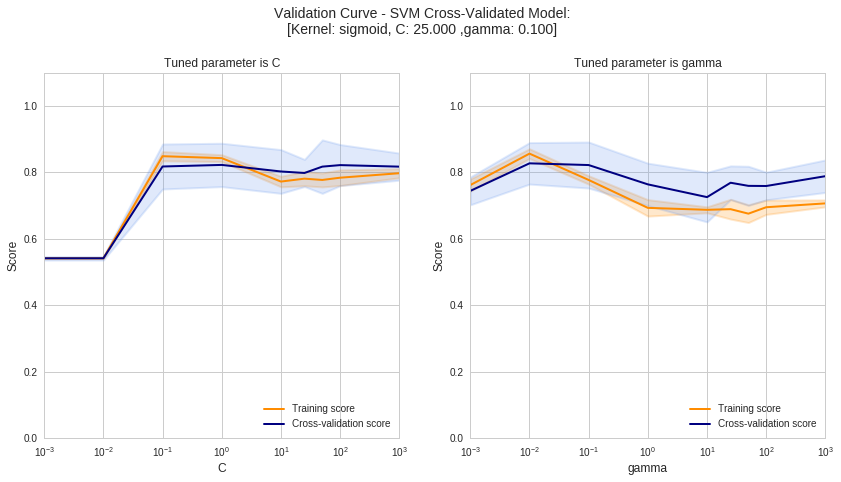

In [0]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import validation_curve
from matplotlib.pyplot import figure
print()
# SVM Cross-Validated Model Validation Curve
fig = plt.figure(figsize=(14, 7));
fig.suptitle('Validation Curve - SVM Cross-Validated Model:\n[Kernel: sigmoid, C: 25.000 ,gamma: 0.100]', fontsize=14)
#plot sx
ax = fig.add_subplot(121)
train_scores, test_scores = validation_curve(
    svm.SVC(kernel='sigmoid'), X_train, y_train, param_name="C", param_range=Cs,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax.set_title("Tuned parameter is C", fontsize=12)
ax.set_xlabel("C", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_ylim(0.0, 1.1)
ax.set_xlim(10**-3, 10**3)
lw = 2
ax.semilogx(Cs, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax.fill_between(Cs, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color="darkorange", lw=lw)
ax.semilogx(Cs, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
ax.fill_between(Cs, test_scores_mean - test_scores_std,test_scores_mean + test_scores_std, alpha=0.2, color="cornflowerblue", lw=lw)
ax.legend(loc=4);

#plot sx
ax = fig.add_subplot(122)
train_scores, test_scores = validation_curve(
    svm.SVC(kernel='sigmoid'), X_train, y_train, param_name="gamma", param_range=gammas,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax.set_title("Tuned parameter is gamma", fontsize=12)
ax.set_xlabel("gamma", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_ylim(0.0, 1.1)
ax.set_xlim(10**-3, 10**3)
lw = 2
ax.semilogx(gammas, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax.fill_between(gammas, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color="darkorange", lw=lw)
ax.semilogx(gammas, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
ax.fill_between(gammas, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color="cornflowerblue", lw=lw)
ax.legend(loc=4);
plt.subplots_adjust(top=0.85)
plt.show()

#### SVM Learning Curve

Shows the validation and training score of an estimator for varying numbers of training samples. By looking at this we can gain insight on how much we benefit from adding more training data and whether the estimator suffers more from a variance error or a bias error.<br>*If both the validation score and the training score converge to a value that is too low with increasing size of the training set, we will not benefit much from more training data.*<br>
*If the training score is much greater than the validation score for the maximum number of training samples, adding more training samples will most likely increase generalization.*


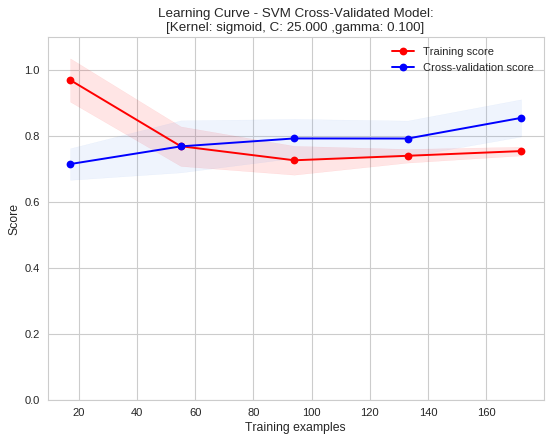

In [0]:
estimator = svm.SVC(kernel='sigmoid', C=25, gamma=0.100)
plot_learning_curve(estimator, "Learning Curve - SVM Cross-Validated Model:\n[Kernel: sigmoid, C: 25.000 ,gamma: 0.100]", X_train, y_train, ylim=(0.0, 1.10), cv=6,
                        n_jobs=-1)

### Dataset Split for DecisionTree, Random Forest

DecisionTree and RandomForest can work directly with categorical data. There is no need for One-Hot Encoding in this case. We just reload the original dataset with categorical data and we map Target column values to {0, 1}.

In [0]:
from sklearn.model_selection import train_test_split
features = ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang',
            'oldpeak','slope','ca','thal','target']
# df = pd.read_csv("datasets/processed_cleveland.data", names=features)
df = pd.read_csv("AlliDataScience/datasets/processed_cleveland.data", names=features)

# processing Target column
target_dict = {0: 0, 1: 1, 2: 1, 3: 1, 4: 1}
y = df.target.map(target_dict).values
df.drop(labels='target', axis="columns", inplace=True)
feature_names = df.columns.values
X = df.values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)  # no normalization

### 3.1 DecisionTree

Decision Trees are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by **learning simple decision rules** inferred from the data features.<br>
Pros:
- Simple to understand and to interpret. Trees can be visualised.
- Requires little data preparation. Other techniques often require data normalisation, dummy variables need to be created and blank values to be removed.<br>*Note that Scikit-Learn DecisionTreeClassifier does not support missing values*.
- The cost of using the tree (i.e., predicting data) is logarithmic in the number of data points used to train the tree.
- Able to handle both numerical and categorical data. No need for One-Hot or Integer encoding.
- Able to handle multi-output problems.
- Interpretability. It's a white-box model, if a given situation is observable in a model, the explanation for the condition is easily explained by boolean logic.

Cons:
- Decision-tree learners can create complex trees that do not generalise the data well, so **overfitting**. Pruning is not actually supported by sklearn. To avoid overfitting we've to set the minimum number of samples required at a leaf node or set the maximum depth of the tree.
- Decision trees can be unstable because small variations in the data might result in a completely different tree being generated. This problem is mitigated by using decision trees within an *ensemble*.

#### Tree Building Process

1. We divide the predictor space — that is, the set of possible values for $X_1, X_2, ..., X_p$ — into J distinct and non-overlapping regions: $R_1, R_2, ..., R_J$ .
2. For every observation that falls into the region ${R_j}$, we make the same prediction, which is simply the mean of the response values for the training observations in $R_j$. *(regression hp.)*

In theory, the regions could have any shape. We can imagine to divide the predictor space into high-dimensional rectangles, or boxes, for simplicity and for ease of interpretation of the resulting predictive model.<br>
The goal is to ﬁnd boxes that minimize the *RSS*, given by the following:
$$
\begin{array}{rrl}
\\
\text{Residual sum of Squares (RSS)} & = & \sum_{i\in\mathbb{R_j}}({residual})^2 \\
RSS & = & \sum_{j=1}^J \sum_{i\in\mathbb{R_j}}({e_i})^2 \\
RSS & = & \sum_{j=1}^J \sum_{i\in\mathbb{R_j}}(y_i-\hat{y_{R_j}})^2 \\
\end{array}
$$
where $\hat{y_{R_j}}$ is the **mean response** for the training observations withing the ${j_{th}}$ box.<br><br>
Since it is computationally infeasible to consider every possible partition of the feature space into J boxes, we take a *top-down*, *greedy approach* that is known as **recursive binary splitting**:
- The approach is **top-down** because it begins at the top of the tree and then successively splits the predictor space; each split is indicated via two new branches further down on the tree.
- It is **greedy** because at each step of the tree-building process, the best split is made at that particular step, rather than looking ahead and picking a split that will lead to a better tree in some future step.

We ﬁrst select the predictor ${X_j}$ and the cutpoint ${s}$ such that splitting the predictor space into the regions ${({X}|{X_j} < {s})}$ and ${({X}|{X_j} ≥ {s})}$ leads to the greatest possible reduction in RSS.<br>
Next, we repeat the process, looking for the best predictor and best cutpoint in order to split the data further so as to minimize the RSS within each of the resulting regions. However, this time, instead of splitting the entire predictor space, we split one of the two previously identiﬁed regions.<br>The process continues until a stopping criterion is reached. This process described may produce good predictions on the training set, but is likely to overﬁt the data, leading to poor test set performance.<br>
For a classiﬁcation tree, we predict that each observation belongs to the most commonly occurring class of training observations in the region to which it belongs. In the classiﬁcation setting, RSS cannot be used as a criterion for making the binary splits.<br>
Others measures are available:
1. Classification error rate (not used, not sufficiently sensitive for tree-growing)
2. Gini Index
3. Cross-Entropy

##### Classification error rate
Is simply the fraction of the training observations in that region that do not belong to the most common class.
\begin{array}{rrl}
\\
\text{Classification Error Rate (E)} & = & 1-\max_{k}(\hat{p_{mk}})^2 \\
\\
\end{array}
where ${p_{mk}}$ represents the proportion of training observations in the mth region that are from the kth class.<br>However classiﬁcation error is not suﬃciently sensitive for tree-growing, and in practice Gini Index and Cross-Entropy measures are preferable.

##### Gini Index
It is a measure of total variance across the K classes. The Gini index takes on a small value if all of the $\hat{p_{mk}}$’s are close to zero or one. Because of this the Gini index is referred to as a measure of node purity, **a small value indicates that a node contains predominantly observations from a single class**.
$$\begin{array}{rrl}
\\
\text{Gini Index (G)} & = & \sum_{k=1}^{K} \hat{p_{mk}}(1-\hat{p_{mk}})
\\
\\
\end{array}$$

##### Cross-Entropy
$$\begin{array}{rrl}
\\
\text{Cross Entropy (D)} & = & -\sum_{k=1}^{K} \hat{p_{mk}}(\log\hat{p_{mk}})
\\
\\
\end{array}$$


#### Classification

- Scikit-learn DecisionTree classifier should not require normalized data (because it hasn't to compute any distance).
- Scikit-learn DecisionTree classifier is also able to handle both numerical and categorical data, so no encoding is needed.
- Scikit-learn DecisionTree classifier can't handle missing values. Rows with missing values (~5 rows) have been removed from the dataset (Cleveland) at the beginning.

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

DecisionTreeClassifier Score on Test Set: 74.444
F-Score : 0.736


                   Predicted Not Affected  Predicted Affected
True Not Affected                      35                  13
True Affected                          10                  32


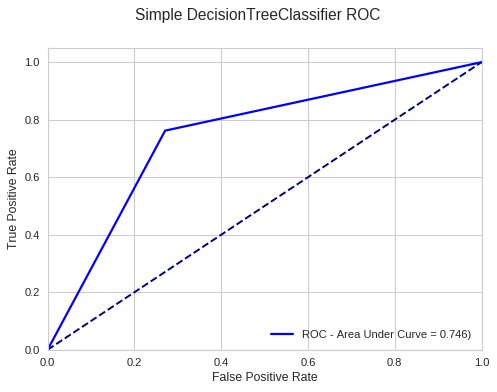

In [0]:
from sklearn import tree
tree_clf = tree.DecisionTreeClassifier(criterion='gini', random_state=0)
print(tree_clf)
print()
tree_clf.fit(X_train, y_train)
y_pred_tree = tree_clf.predict(X_test)

score = 100 * metrics.accuracy_score(y_test, y_pred_tree)
tree_f_score = metrics.f1_score(y_test, y_pred_tree) # F-Score
print("DecisionTreeClassifier Score on Test Set: %.03f\nF-Score : %.03f" % (score, tree_f_score))

print()
print()

cm = metrics.confusion_matrix(y_test, y_pred_tree)
cm_table = pd.DataFrame(
    cm,
    columns=['Predicted Not Affected', 'Predicted Affected'],
    index=['True Not Affected', 'True Affected']
)
print(cm_table)
plot_roc_curve(y_test, y_pred_tree, "Simple DecisionTreeClassifier ROC")

# # export tree image
# tree.export_graphviz(tree_clf, out_file='tree.dot', feature_names=feature_names)
# from subprocess import call
# call(['dot', '-T', 'png', 'tree.dot', '-o', 'tree_w_onehot.png'])

#### Decision Tree Classifier Parameters - AUC ROC

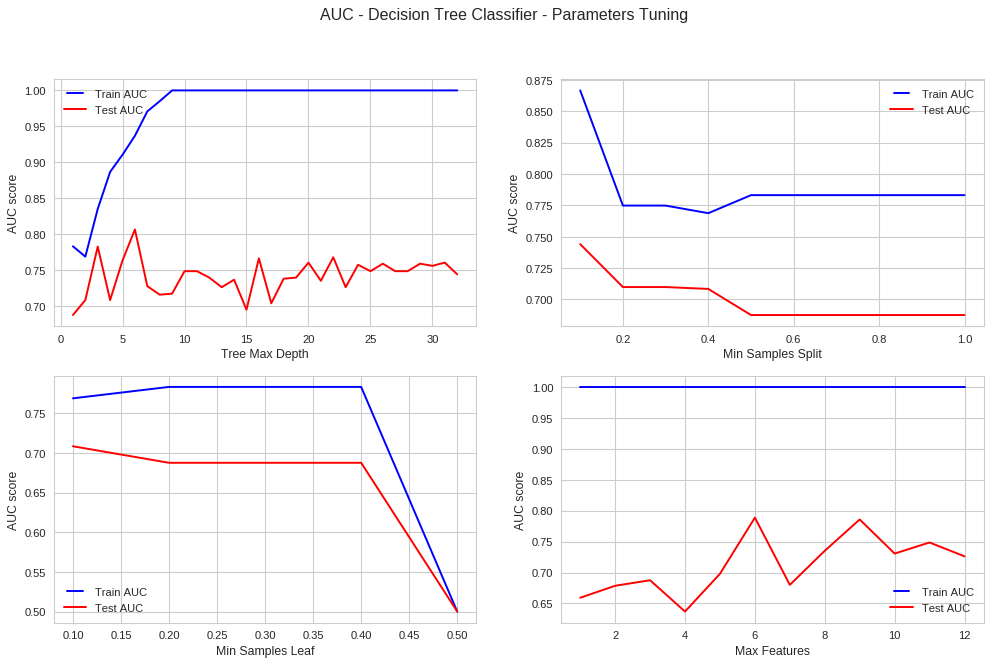

In [0]:
import numpy as np
# general analysis
from matplotlib.legend_handler import HandlerLine2D
print()
# max depth analysis
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
    dt = tree.DecisionTreeClassifier(max_depth=max_depth)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    # Add auc score to previous train results
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    # Add auc score to previous test results
    test_results.append(roc_auc)

fig = plt.figure(figsize=(15,9), dpi=80)
ax = fig.add_subplot(221)
line1, = ax.plot(max_depths, train_results, 'b', label="Train AUC")
line2, = ax.plot(max_depths, test_results, 'r', label="Test AUC")
ax.set(xlabel="Tree Max Depth")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=2)

# min samples split analysis
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
    dt = tree.DecisionTreeClassifier(min_samples_split=min_samples_split)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

ax2 = fig.add_subplot(222)
line1, = ax2.plot(min_samples_splits, train_results, 'b', label="Train AUC")
line2, = ax2.plot(min_samples_splits, test_results, 'r', label="Test AUC")
ax2.set(xlabel="Min Samples Split")
plt.ylabel("AUC score")  # in common
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=1)

# min samples leafs analysis
min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
    dt = tree.DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

ax3 = fig.add_subplot(223)
ax3.set(xlabel="Min Samples Leaf")
line1, = ax3.plot(min_samples_leafs, train_results, 'b', label="Train AUC")
line2, = ax3.plot(min_samples_leafs, test_results, 'r', label="Test AUC")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=3)

# max features analysis
max_features = list(range(1, X_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
    dt = tree.DecisionTreeClassifier(max_features=max_feature)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

ax4 = fig.add_subplot(224)
ax4.set(xlabel="Max Features")
line1, = ax4.plot(max_features, train_results, 'b', label="Train AUC")
line2, = ax4.plot(max_features, test_results, 'r', label="Test AUC")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc="best")
fig.suptitle("AUC - Decision Tree Classifier - Parameters Tuning")
plt.show()

#### DecisionTree Classifier Parameters
- **Max Depth**:<br>
This parameter indicates the depth of the tree. A very deep tree is one with a lot of splits (relatively). The more splits it has the more information about the data (training ones) it captures.<br> From the AUC plot we can see that our model overfits for large depth values. The tree perfectly predicts all of the train data ($\textit{AUC}=1$ from $\textit{max_depth} ~ 10$), however, it fails to generalize with never seen data.
- **Min Samples Split**:<br>
Is the minimum number of samples required to split an internal node. This can vary between considering at least one sample at each node to considering all of the samples at each node. The more we increase this parameter, the more the tree becomes more constrained, this because it has to consider more samples at each node. In our experiment this parameter will vary from 10% to 100% of the samples.<br>
- **Min Samples Leaf**:<br>
The minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. This may have the effect of smoothing the model.<br>
What we see from the relative plot is that increasing this value may cause underfitting, the model won't be able to learn enough about the data.
- **Max Features**:<br>
The number of features to consider when looking for the best split. From the plot we see that we are clearly having overfitting. The strange thing is that overfitting over each value of max_features. This behaviour can be explained by the folowing scikit-learn note for this parameter: "*the search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than max_features features.*"


#### Decision Tree Classifier - Validation Curves

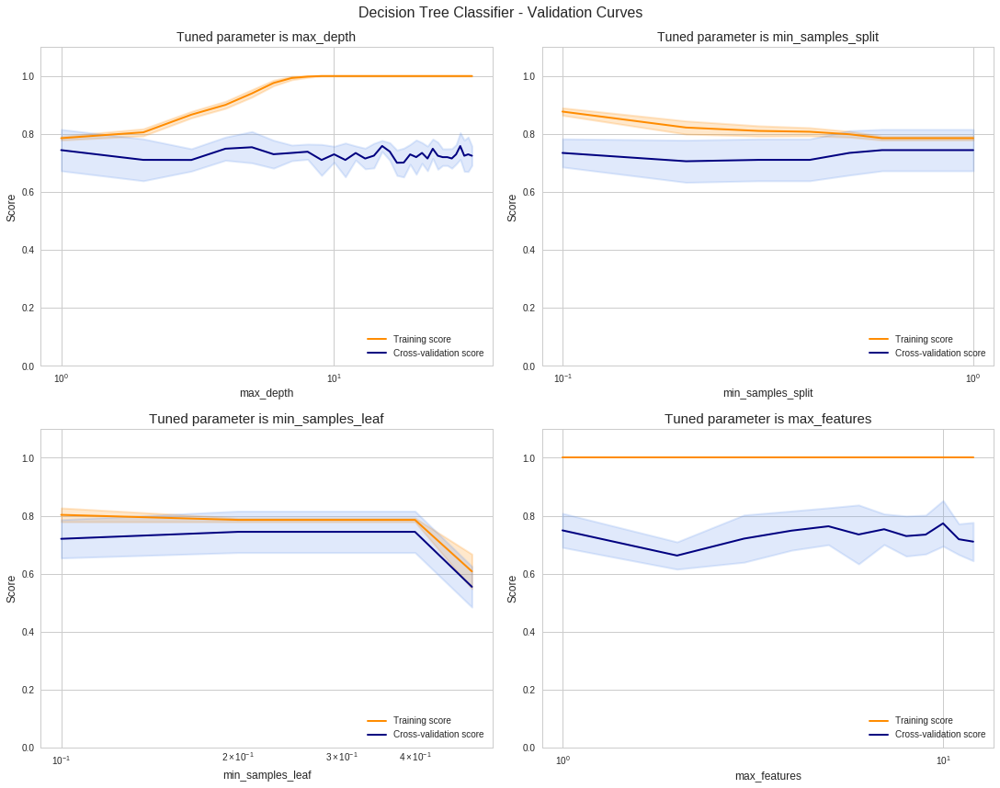

In [0]:
# Validation curve DecisionTree Classifier - parameters
print()
fig, ((ax, ax1),(ax2, ax3)) = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(15, 12), constrained_layout=True)
# max_depth
train_scores, test_scores = validation_curve(
    tree.DecisionTreeClassifier(), X_train, y_train, param_name="max_depth", param_range=max_depths,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax.set_title("Tuned parameter is max_depth", fontsize=14)
ax.set_xlabel("max_depth", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_ylim(0.0, 1.1)
ax.set_autoscalex_on(True)
lw = 2
ax.semilogx(max_depths, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax.fill_between(max_depths, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
ax.semilogx(max_depths, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax.fill_between(max_depths, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="cornflowerblue", lw=lw)
ax.legend(loc=4);


# min_samples_split
train_scores, test_scores = validation_curve(
    tree.DecisionTreeClassifier(), X_train, y_train, param_name="min_samples_split", param_range=min_samples_splits,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax1.set_title("Tuned parameter is min_samples_split", fontsize=14)
ax1.set_xlabel("min_samples_split", fontsize=12)
ax1.set_ylabel("Score", fontsize=12)
ax1.set_ylim(0.0, 1.1)
ax1.set_autoscalex_on(True)
lw = 2
ax1.semilogx(min_samples_splits, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax1.fill_between(min_samples_splits, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)

ax1.semilogx(min_samples_splits, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
ax1.fill_between(min_samples_splits, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="cornflowerblue", lw=lw)
ax1.legend(loc=4);


#min_samples_leaf
train_scores, test_scores = validation_curve(
    tree.DecisionTreeClassifier(), X_train, y_train, param_name="min_samples_leaf", param_range=min_samples_leafs,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax2.set_title("Tuned parameter is min_samples_leaf", fontsize=15)
ax2.set_xlabel("min_samples_leaf", fontsize=12)
ax2.set_ylabel("Score", fontsize=12)
ax2.set_ylim(0.0, 1.1)
ax2.set_autoscalex_on(True)
lw = 2
ax2.semilogx(min_samples_leafs, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax2.fill_between(min_samples_leafs, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
ax2.semilogx(min_samples_leafs, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax2.fill_between(min_samples_leafs, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="cornflowerblue", lw=lw)
ax2.legend(loc=4);


#max_features
max_features = list(range(1, X_train.shape[1]))
train_scores, test_scores = validation_curve(
    tree.DecisionTreeClassifier(), X_train, y_train, param_name="max_features", param_range=max_features,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
ax3.set_title("Tuned parameter is max_features", fontsize=15)
ax3.set_xlabel("max_features", fontsize=12)
ax3.set_ylabel("Score", fontsize=12)
ax3.set_ylim(0.0, 1.1)
ax3.set_autoscalex_on(True)
lw = 2
ax3.semilogx(max_features, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax3.fill_between(max_features, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
ax3.semilogx(max_features, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax3.fill_between(max_features, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="cornflowerblue", lw=lw)
ax3.legend(loc=4);

fig.suptitle('Decision Tree Classifier - Validation Curves\n', fontsize=16)
plt.show()

### 3.1 Random Forest

Before digging into Random Forest let's introduce some fundamental concepts!<br>
1. **Bootstrap**:<br>*Bootstrapping is a statistical resampling technique that involves random sampling of a dataset with replacement.* It is often used as a means of quantifying the uncertainty associated with a machine learning model.<br>The idea is to repeatedly sample data with replacement from the original training set in order to produce multiple separate training sets. These are then used to allow "meta-learner" or "ensemble" methods to reduce the variance of their predictions, thus greatly improving their predictive performance. Two of the following ensemble techniques–bagging and random forests–make heavy use of bootstrapping techniques.
2. **Bagging** or Bootstrap aggregation:<br> *"Decision trees can be unstable because small variations in the data might result in a completely different tree being generated. This problem is mitigated by using decision trees within an ensemble*."<br>Bagging is a general-purpose procedure for reducing the variance of a statistical learning method. It is particularly useful and frequently used in the context of decision trees.<br>We generate B different bootstrapped (random sampling with replacement) training data sets. We then train our method on the $b_{th}$ bootstrapped training set in order to get $\hat{f}^{*b}(x)$, the prediction at a point ${x}$. We then average *(regression case)* all the predictions to obtain:<br>
$$\begin{array}{rrl}
\\
{\hat{f}_{bag}}(x) & = & \frac{1}{B}\sum_{b=1}^{B} \hat{f}^{*b}(x)
\\
\\
\end{array}$$
In case of Classification Trees, for each test observation, we record the class predicted by each of the B trees, and take a majority vote: the overall prediction is the most commonly occurring class among the B predictions.

One issue with Bagging in case of Decision Tree Classifier is that trees/predictors are correlated, the trees tend to be similar, first cuts are always the same.
*If we consider one strong predictor in our data set which reduces a measure of error (ex: Gini, Cross-Entropy) the most. All our bagged trees tend to to make the same cuts because they all share the same features. This makes all these trees look very similar hence increasing correlation.*<br><br>
#### Random forests
Provide an improvement over bagged trees by way of a small tweak that decorrelates the trees. This reduces the variance when we average the trees:
- As in bagging, we build a number of decision trees on bootstrapped training samples.
- But when building these decision trees, each time a split in a tree is considered, **a random selection of m predictors** is chosen as split candidates from the full set of p predictors. The split is allowed to use only one of those m predictors.
- A fresh selection of m predictors is taken at each split, and typically we choose $ {m} \sim \sqrt[2]{p}$ — that is, the number of predictors considered at each split is approximately equal to the square root of the total number of predictors.
<br>

To solve tree correlation we allow random forest to randomly choose only 𝑚 predictors in performing the split. Now the bagged trees all have different randomly selected features to perform cuts on.<br>Therefore, the feature space is split on different predictors, **decorrelating all the trees**.

We get that, by setting the parameter $\textit{max_features}=\textit{num_dataset_features}$ we will be constructing a Bagged Decision Tree model.<br>If $\textit{max_features}<\textit{num_dataset_features}$ we will be performing Random Forest. It is always a good idea to tune this parameter in constructing any model.

In [0]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
# Parameters Tuning
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid

tuned_parameters = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}



---



**ATTENTION** the cell below is computationally heavy

In [0]:
# cv_rf = GridSearchCV(RandomForestClassifier(), tuned_parameters, cv=5, refit=True, return_train_score=True)
cv_rf = RandomizedSearchCV(RandomForestClassifier(), tuned_parameters, cv=6, n_iter=100, refit=True, random_state=0, verbose=2, return_train_score=True, n_jobs=-1)
cv_rf.fit(X_train, y_train)

print('RandomizedSearchCV 6-Fold on Training Set')
print('Best_parameters are: ', cv_rf.best_params_)
cv_rf_accuracy = 100 * float(cv_rf.best_score_)
print('Accuracy Score (AVG on all folds scores) is: %.03f%% ' % cv_rf_accuracy)
print()

# best estimator is accessible by "clf2.best_estimator_" if refit=TRUE
y_pred = cv_rf.best_estimator_.predict(X_test)
score = 100 * metrics.accuracy_score(y_test, y_pred)
print("cv_rf - Accuracy Score on Test Set is %.2f%%" % score)

# Result of RandomizedSearchCV with fixed random states, too computational expensive re-doing it each time..
# GridSearchCV 5-Fold on Training Set
# Best_parameters are:  {'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'auto', 'max_depth': 90, 'bootstrap': True}
# Accuracy Score (AVG on all folds scores) is: 84.058%
<# cv_rf - Accuracy Score on Test Set is 86.67%

Fitting 6 folds for each of 100 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:  7.5min finished


RandomizedSearchCV 6-Fold on Training Set
Best_parameters are:  {'n_estimators': 1800, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True}
Accuracy Score (AVG on all folds scores) is: 83.092% 

cv_rf - Accuracy Score on Test Set is 82.22%




---



RandomForestClassifier(bootstrap='True', class_weight=None, criterion='gini',
            max_depth=30, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=4, min_samples_split=5,
            min_weight_fraction_leaf=0.0, n_estimators=1800, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

tuned_rf - Accuracy Score on Test Set is 82.222%
F-Score: 0.789


                   Predicted Not Affected  Predicted Affected
True Not Affected                      44                   4
True Affected                          12                  30



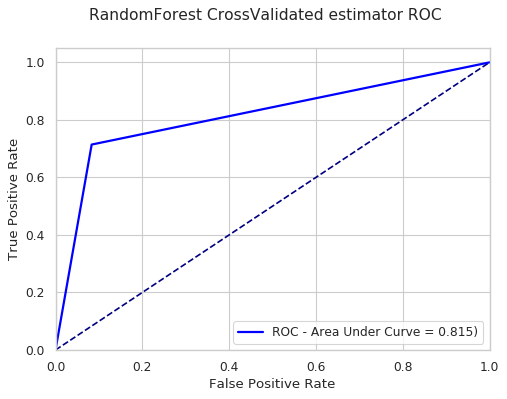

In [0]:
tuned_rf = RandomForestClassifier(n_estimators=1800, min_samples_split=5, min_samples_leaf=4,
                                  max_features='sqrt', max_depth=30, bootstrap='True', random_state=0)
print(tuned_rf)
print()
tuned_rf.fit(X_train, y_train)
y_pred_rf = tuned_rf.predict(X_test)

score = 100 * metrics.accuracy_score(y_test, y_pred_rf)
rf_f_score = metrics.f1_score(y_test, y_pred_rf) # F-Score

print("tuned_rf - Accuracy Score on Test Set is %.3f%%\nF-Score: %.03f" % (score, rf_f_score))
print()

# ROC Curve - UAC
cm = metrics.confusion_matrix(y_test, y_pred_rf)
cm_table = pd.DataFrame(
    cm,
    columns=['Predicted Not Affected', 'Predicted Affected'],
    index=['True Not Affected', 'True Affected'])
print()
print(cm_table)
print()
plot_roc_curve(y_test, y_pred_rf, "RandomForest CrossValidated estimator ROC")

#### Showing the feature relative importance in tuned RandomForest Classifier model


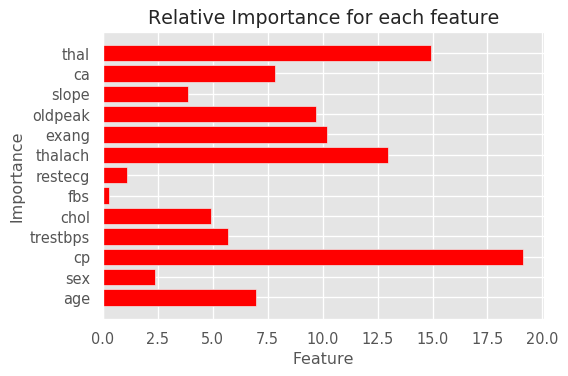

In [0]:
rf_features_importance = pd.DataFrame(tuned_rf.feature_importances_,
                                   index = feature_names,
                                    columns=['importance'])
# display(rf_features_importance)
plt.figure(dpi=95)
plt.style.use('ggplot')
y = 100*(rf_features_importance['importance'].get_values())
x_pos = [i for i, _ in enumerate(x)]

plt.barh(x_pos, y, color='red')
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Relative Importance for each feature")
plt.yticks(x_pos, feature_names)
plt.show()

In [0]:
pd.options.display.max_colwidth = 150
features_table = pd.read_csv("AlliDataScience/datasets/features_heart.csv")
#features_table = pd.read_csv("datasets/features_heart.csv")
print("Not encoded features: ")
display(features_table)

Not encoded features: 


,Extracted Feature,Type,Description
0,age,Continuous,Age in years
1,sex,Binary,1 = male; 0 = female
2,cp,Categorical,"Chest pain type (typical angina, atypical angina, non-anginal, asymptomatic angina)"
3,trestbps,Continuous,Resting blood pressure (in mm Hg)
4,chol,Continuous,Serum cholesterol (in mg/dl)
5,fbs,Binary,"Fasting blood sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)"
6,restecg,Categorical,"0:normal, 1: ST-T wave abnormality, 2:left ventricular hypertrophy"
7,thalach,Continuous,Maximum heart rate achieved during thalium stress test
8,exang,Binary,"Exercise induced angina (1 = yes, 0 = no)"
9,oldpeak,Continuous,ST depression induced by exercise relative to rest


#### RandomForest - max_features tuning
$\textit{max_features}$ is the number of features to consider when looking for the best split.



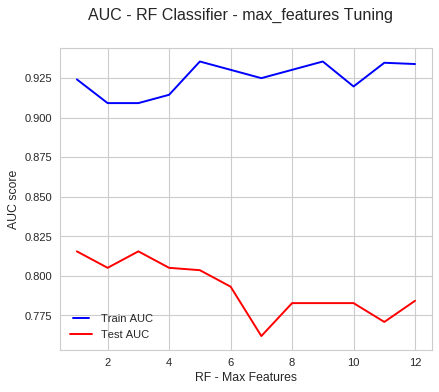

In [0]:
# max features analysis
# RF - CrossValidated Model is:
# RandomizedSearchCV 6-Fold on Training Set
# Best_parameters are:  {'n_estimators': 1800, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True}
# Accuracy Score (AVG on all folds scores) is: 83.092% 
# cv_rf - Accuracy Score on Test Set is 82.22%

max_features = list(range(1, X_train.shape[1]))
train_results = []
test_results = []
for i in max_features:
    dt = RandomForestClassifier(max_features=i, n_estimators= 600, min_samples_split=5, min_samples_leaf=4, max_depth=10, bootstrap=True)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

fig, ax = plt.subplots(figsize=(6,5), dpi=80)
fig.suptitle("AUC - RF Classifier - max_features Tuning")
ax.set(xlabel="RF - Max Features")
line1, = ax.plot(max_features, train_results, 'b', label="Train AUC")
line2, = ax.plot(max_features, test_results, 'r', label="Test AUC")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc="best")
plt.show()

What we see from the plot above is that we **overfit** for high value of max_features. Max value for max_features is the current dataset number of features.

#### RadomForest Classifier - Validation Curves

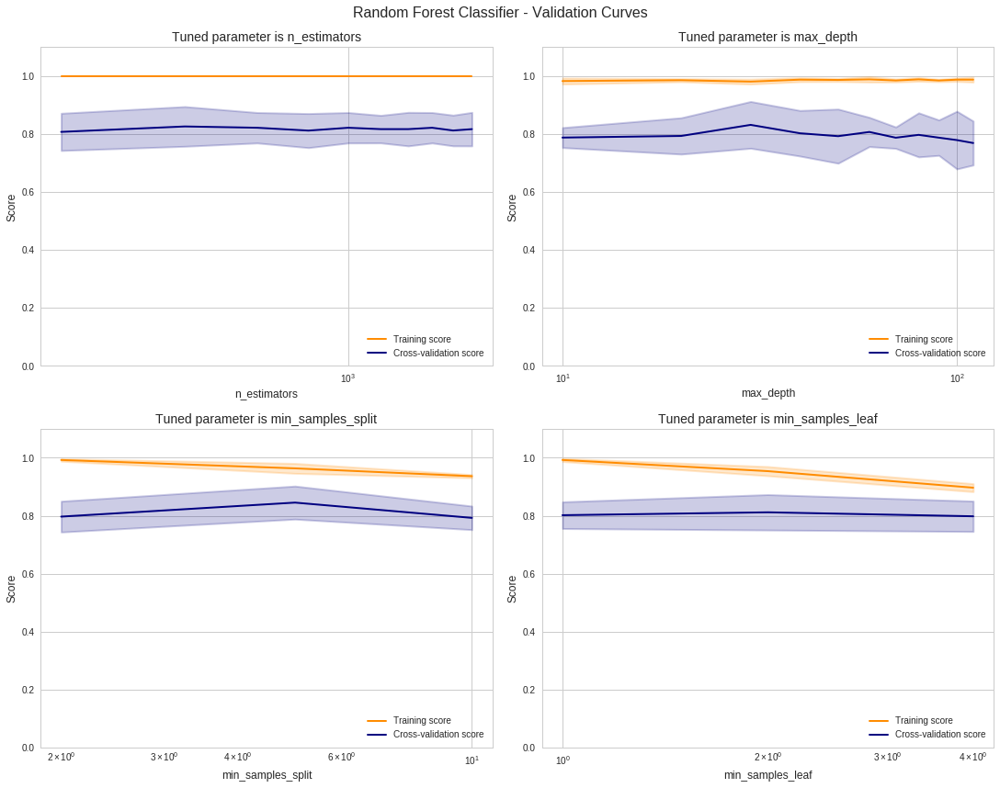

In [0]:
#### RandomForest Classifier - Validation Curves
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
print()

fig, ((ax, ax1),(ax2, ax3)) = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(15, 12), constrained_layout=True)
# n_estimators
train_scores, test_scores = validation_curve(
    RandomForestClassifier(), X_train, y_train, param_name="n_estimators", param_range=n_estimators,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax.set_title("Tuned parameter is n_estimators", fontsize=14)
ax.set_xlabel("n_estimators", fontsize=12)
ax.set_ylabel("Score", fontsize=12)
ax.set_ylim(0.0, 1.1)
ax.set_autoscalex_on(True)
lw = 2
ax.semilogx(n_estimators, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax.fill_between(n_estimators, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
ax.semilogx(n_estimators, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax.fill_between(n_estimators, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
ax.legend(loc=4);


# max_depth
train_scores, test_scores = validation_curve(
    RandomForestClassifier(), X_train, y_train, param_name="max_depth", param_range=max_depth,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax1.set_title("Tuned parameter is max_depth", fontsize=14)
ax1.set_xlabel("max_depth", fontsize=12)
ax1.set_ylabel("Score", fontsize=12)
ax1.set_ylim(0.0, 1.1)
ax1.set_autoscalex_on(True)
lw = 2
ax1.semilogx(max_depth, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax1.fill_between(max_depth, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)

ax1.semilogx(max_depth, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
ax1.fill_between(max_depth, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
ax1.legend(loc=4);


#min_samples_split
train_scores, test_scores = validation_curve(
    RandomForestClassifier(), X_train, y_train, param_name="min_samples_split", param_range=min_samples_split,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
ax2.set_title("Tuned parameter is min_samples_split", fontsize=14)
ax2.set_xlabel("min_samples_split", fontsize=12)
ax2.set_ylabel("Score", fontsize=12)
ax2.set_ylim(0.0, 1.1)
ax2.set_autoscalex_on(True)
lw = 2
ax2.semilogx(min_samples_split, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax2.fill_between(min_samples_split, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
ax2.semilogx(min_samples_split, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax2.fill_between(min_samples_split, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
ax2.legend(loc=4);

#min_samples_leaf
train_scores, test_scores = validation_curve(
    RandomForestClassifier(), X_train, y_train, param_name="min_samples_leaf", param_range=min_samples_leaf,
    cv=6, scoring="accuracy", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ax3.set_title("Tuned parameter is min_samples_leaf", fontsize=14)
ax3.set_xlabel("min_samples_leaf", fontsize=12)
ax3.set_ylabel("Score", fontsize=12)
ax3.set_ylim(0.0, 1.1)
ax3.set_autoscalex_on(True)
lw = 2
ax3.semilogx(min_samples_leaf, train_scores_mean, label="Training score", color="darkorange", lw=lw)
ax3.fill_between(min_samples_leaf, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
ax3.semilogx(min_samples_leaf, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)

ax3.fill_between(min_samples_leaf, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
ax3.legend(loc=4);

fig.suptitle('Random Forest Classifier - Validation Curves\n', fontsize=16)
plt.show()


#### RadomForest Classifier - Learning Curve

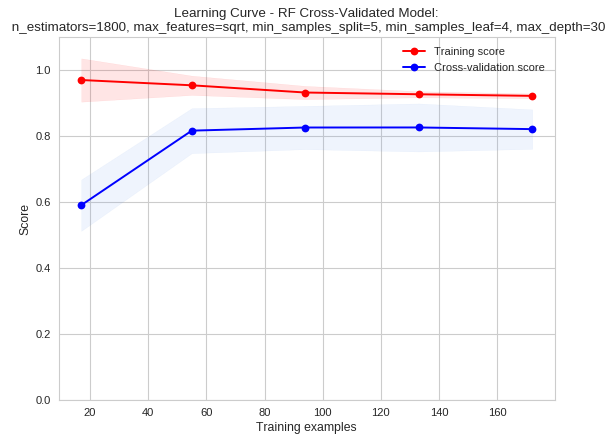

In [0]:
estimator = RandomForestClassifier(n_estimators=1800, min_samples_split=5, min_samples_leaf=4,
                                 max_features='sqrt', max_depth=30, bootstrap='True', random_state=0)
plot_learning_curve(estimator, "Learning Curve - RF Cross-Validated Model:\n n_estimators=1800, max_features=sqrt, min_samples_split=5, min_samples_leaf=4, max_depth=30", X_train, y_train,
                    ylim=(0.0, 1.10), cv=6,n_jobs=-1)


### Comparing ROC Curves of Different Classifiers

In [0]:
# function for sub-plotting roc curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
def subplot_roc_curve(fig, numsub, y_test, y_pred, subplot_title, color):
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    ax = fig.add_subplot(numsub)
    ax.set(xlabel='False Positive Rate')
    plt.ylabel('True Positive Rate')
    ax.plot([0, 1], [0, 1], color="k", linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    ax.set_title(subplot_title, fontsize=15)
    ax.plot(false_positive_rate, true_positive_rate, color=color, lw=2, label='ROC - Area Under Curve = %0.3f)' % roc_auc)
    plt.legend(loc=1)

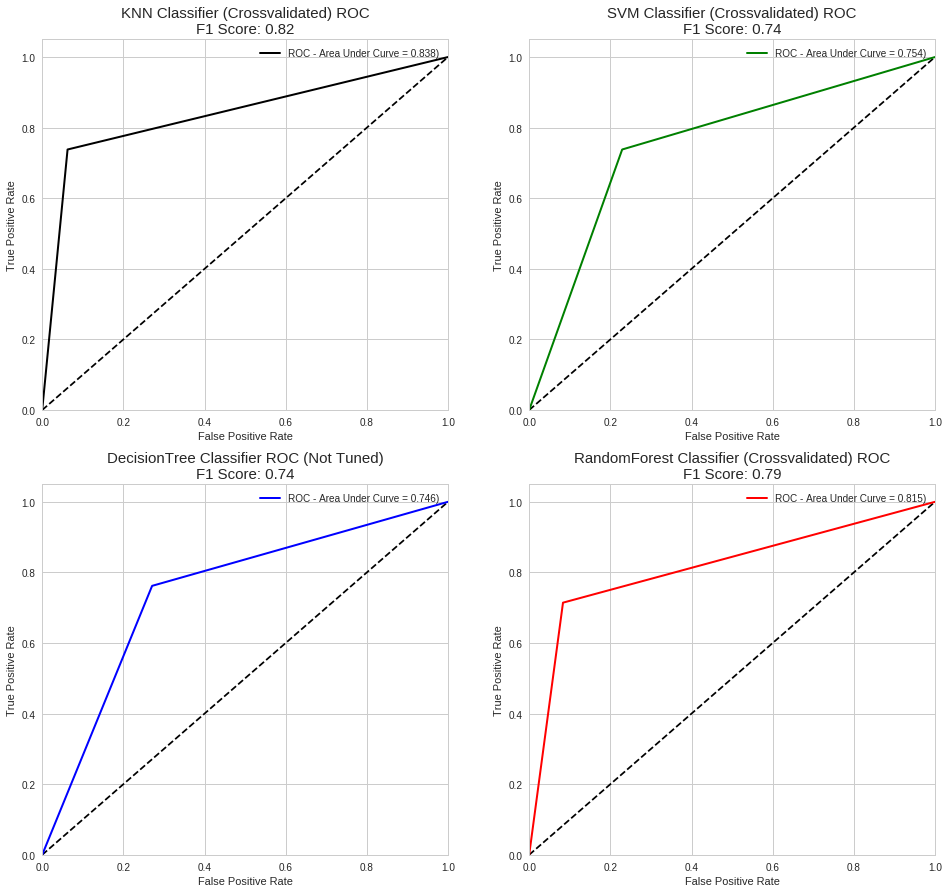


KNN CrossValidated, F-Score: 0.82
SVM CrossValidated, F-Score: 0.74
DecisionTree Classifier, F-Score: 0.74
RandomForest CrossValidated, F-Score: 0.79


In [0]:
fig = plt.figure(figsize=(16,15))
subplot_roc_curve(fig, 221, y_test_knn, y_pred_knn, "KNN Classifier (Crossvalidated) ROC\nF1 Score: %.02f" % knn_f_score, "k")
subplot_roc_curve(fig, 222, y_test_svm, y_pred_svm, "SVM Classifier (Crossvalidated) ROC\nF1 Score: %.02f" % svm_f_score, "g")
subplot_roc_curve(fig, 223, y_test, y_pred_tree, "DecisionTree Classifier ROC (Not Tuned)\nF1 Score: %.02f" % tree_f_score, "b")
subplot_roc_curve(fig, 224, y_test, y_pred_rf, "RandomForest Classifier (Crossvalidated) ROC\nF1 Score: %.02f" % rf_f_score, "r")
plt.show()
print()
print("KNN CrossValidated, F-Score: %.02f" % knn_f_score)
print("SVM CrossValidated, F-Score: %.02f" % svm_f_score)
print("DecisionTree Classifier, F-Score: %.02f" % tree_f_score)
print("RandomForest CrossValidated, F-Score: %.02f" % rf_f_score)

We have tuned several classifier, for each of them we applied the same approach:
1. Cross-Validation for retrieving the best parameter configuration for the specific classifier
2. Scoring the tuned classifier with the parameter combination found by cross-validation on the Test Set

The best working Classifier on this dataset is the **KNearest Neighbors Classifier** (sklearn.neighbors.KNeighborsClassifier) with this parameter configuration:

| Parameter   | Value     |
|-------------|-----------|
| n_neighbors | 70        |
| algorithm   | auto      |
| leaf_size   | 30        |
| metric      | minkowski |
| p           | 2         |
| weights     | uniform   |

Achieving **Accuracy Score on Test Set** of 0.84058 (+/-0.10341)


#### References
- Decision Tree, Boosting, Bagging: *An Introduction To Statistical Learning, by Robert Tibshirani and Trevor Hastie (chapter 8.1)*
- Random Forest: *An Introduction To Statistical Learning, by Robert Tibshirani and Trevor Hastie (chapter 8.2)*
- Cross-Validation: *An Introduction To Statistical Learning, by Robert Tibshirani and Trevor Hastie (chapter 5)*
- SVM Theory: *Slide Barbara Caputo ML Course 18-19 Polito*
- SVM Theory: *fourier.eng.hmc.edu/e161/lectures/svm.tex*
- SVM scikit-learn: *https://scikit-learn.org/stable/modules/svm.html*
- Boxplot: *http://www.physics.csbsju.edu/stats/box2.html*
- Data Visualization with Seaborn: *https://www.kaggle.com/jchen2186/data-visualization-with-python-seaborn*
- OneHot illustration: *https://www.tensorflow.org/guide/feature_columns*
- Decision Tree Tuning: *https://medium.com/@mohtedibf/indepth-parameter-tuning-for-decision-tree-6753118a03c3*
- Validation Curve: *https://scikit-learn.org/stable/modules/learning_curve.html*
- Bootstrap: *Bootstrap Methods: Another Look at the Jackknife, B.Efron*
- Scikit-learn documentation
- code for generating Cross-Validation example figures: *https://jakevdp.github.io/PythonDataScienceHandbook/06.00-figure-code.html#2-Fold-Cross-Validation*
- Displaying the results of a Grid Search: *Kaggle, utility function, https://www.kaggle.com/grfiv4/displaying-the-results-of-a-grid-search*
- $\textit{L'arte di scrivere con LaTeX}$: *Lorenzo Pantieri*
- KNN reference: *https://towardsdatascience.com/k-nearest-neighbours-introduction-to-machine-learning-algorithms-18e7ce3d802a*
- Some useful LaTeX equations: *https://github.com/rasbt/pattern_classification/blob/master/resources/latex_equations.md#distance-euclidean*
- Others
